# Librerías

In [2]:
# Manipulación y análisis de datos
import numpy as np
import pandas as pd

# Preprocesamiento de datos y ML
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score, precision_score, recall_score, roc_auc_score, roc_curve
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier, plot_tree

# Visualización de datos
import matplotlib.pyplot as plt
import missingno as msno
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

# Visualización de nube de palabras
from collections import Counter
import string
from wordcloud import WordCloud
from matplotlib.colors import LinearSegmentedColormap

# Expresiones regulares
import re

# NLP (Natural Language Processing)
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Otros
from transformers import pipeline
import random
import os
import warnings
import ipywidgets as widgets

# Configuración de warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)


In [3]:
# Descargar stopwords de NLTK
nltk.download('stopwords')
stop_words = set(stopwords.words('portuguese'))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Usuario\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


# Análisis de Sentimientos en Portugués

# Dataset

In [5]:
# Ruta base 
path_base = "DATA/"

# Rutas específicas de los archivos
path_input_dataset = os.path.join(path_base, "olist_order_reviews_dataset.csv")
path_data = os.path.join(path_base, "df_EDA.csv")

In [6]:
reviews_data = pd.read_csv(path_input_dataset)

print(f'Dimensiones del DataFrame de entrada: {reviews_data.shape}')
display(reviews_data.head())

Dimensiones del DataFrame de entrada: (99224, 7)


,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


# Procesamiento de datos

In [7]:
missing_values = reviews_data.isnull().sum()
print(missing_values)

review_id                      0
order_id                       0
review_score                   0
review_comment_title       87656
review_comment_message     58247
review_creation_date           0
review_answer_timestamp        0
dtype: int64


In [8]:
reviews_data[reviews_data.review_comment_message.isnull()].head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
5,15197aa66ff4d0650b5434f1b46cda19,b18dcdf73be66366873cd26c5724d1dc,1,NaN,NaN,2018-04-13 00:00:00,2018-04-16 00:39:37
6,07f9bee5d1b850860defd761afa7ff16,e48aa0d2dcec3a2e87348811bcfdf22b,5,NaN,NaN,2017-07-16 00:00:00,2017-07-18 19:30:34


In [9]:
reviews_data[reviews_data.review_comment_message.isnull()]['review_score'].value_counts()

review_score
5    36774
4    13166
3     4622
1     2679
2     1006
Name: count, dtype: int64

In [10]:
#Se eliminan las review_comment_message con nulos
reviews_data = reviews_data.dropna(subset =['review_comment_message'])
print(reviews_data.isnull().sum())
print(reviews_data.shape)

review_id                      0
order_id                       0
review_score                   0
review_comment_title       31138
review_comment_message         0
review_creation_date           0
review_answer_timestamp        0
dtype: int64
(40977, 7)


In [11]:
#Procesamiento de duplicados
duplicated_rows = reviews_data[reviews_data.duplicated()]
print(duplicated_rows.shape)
#Drop duplicates
reviews_data = reviews_data.drop_duplicates()
print(reviews_data.shape)

(0, 7)
(40977, 7)


# Exploración del Dataset


In [12]:
reviews_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 40977 entries, 3 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                40977 non-null  object
 1   order_id                 40977 non-null  object
 2   review_score             40977 non-null  int64 
 3   review_comment_title     9839 non-null   object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     40977 non-null  object
 6   review_answer_timestamp  40977 non-null  object
dtypes: int64(1), object(6)
memory usage: 2.5+ MB


In [13]:
reviews_data.describe(include= 'number')

,review_score
count,40977.000000
mean,3.669864
std,1.615418
min,1.000000
25%,2.000000
50%,5.000000
75%,5.000000
max,5.000000


In [15]:
reviews_data.describe(exclude= 'number')

,review_id,order_id,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
count,40977,40977,9839,40977,40977,40977
unique,40668,40836,4123,36159,622,40642
top,32415bbf6e341d5d517080a796f79b5c,8e17072ec97ce29f0e1f111e598b0c85,Recomendo,Muito bom,2017-12-20 00:00:00,2018-03-21 01:02:05
freq,3,3,354,230,202,3


In [16]:
reviews_data.sample(20)

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
96146,51ede476d855cb92d6b66a21941896e7,57829c554e00894996ac7cdc85692e8f,5,Eu recomendo,Recebi minha mercadoria antes do prazo...\r\ne...,2018-04-25 00:00:00,2018-04-26 23:34:51
74609,b1c18045cdea093ef77d2846e9b3c752,e4dbab8bc2ed64c1bfeb63cf0765c0c1,4,NaN,Tudo certo,2018-03-17 00:00:00,2018-03-18 00:14:19
727,169f34e00e26eea55ba60c7b19170e66,93aa1607392862dacfb4b54774480f1d,5,Regular,Loja em si é boa pena a americana nao da supor...,2018-05-10 00:00:00,2018-05-10 19:02:31
71628,b2f29be148f2e96c331593c1e8f14112,f199cd14cb3f15b4b30dd5b94dcb7cc1,4,NaN,"Produto de material de boa qualidade, porém as...",2017-05-23 00:00:00,2017-05-24 19:44:12
59319,15c5694ee17c60cc530bc02a86b8e2a9,dc31605d33a65a68258480700bc6f87b,4,Ótimo custo beneficio,"A película ficou com ar nas bordas, acho que é...",2018-07-10 00:00:00,2018-07-10 22:49:40
89445,2d40ef8f487eac6517166791672d1cce,1b70309f9d8c8068c52cab917fb26379,5,bom,bom,2018-08-04 00:00:00,2018-08-05 12:10:43
17855,f974c7b1d486c68ef3f466fa9b0b4de5,13c9b5d9c2ccb662b1d4e636b424de20,4,NaN,Recebido,2017-11-30 00:00:00,2017-12-03 08:29:28
95235,5e99633e8cba44bb1f5394d78fc139f4,7a9f1869ace3e3dabe41cef449258401,4,NaN,Produto entregue corretamente.\r\n,2017-09-16 00:00:00,2017-09-16 20:28:53
46578,0a997585ee6ed5a775b3ad71f0882f0f,04031be66943a9c385ff683fcc99d288,1,NaN,NÃO RECEBI e NINGUEM da LOJA ME CONTATOU POR E...,2017-10-06 00:00:00,2017-10-06 23:05:29
13850,317424786f416435834d8cea3d02112f,1930118fbe694636a60c0d5f97c32597,5,NaN,Os produtos são de ótima qualidade.,2017-05-25 00:00:00,2017-05-26 14:20:11


#  Nube de Palabras

Creación de nube de palabras que representa la frecuencia de las palabras más comunes en los comentarios de las reseñas



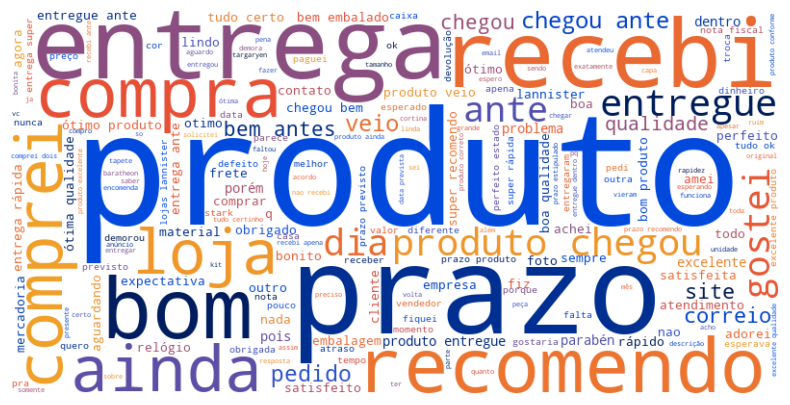

In [ ]:
# Concatenar todos los comentarios en un solo texto
text = " ".join(reviews_data['review_comment_message'].astype(str))

# Limpiar el texto: eliminar puntuaciones y convertir a minúsculas
text = text.translate(str.maketrans("", "", string.punctuation)).lower()

# Crear la nube de palabras
wordcloud = WordCloud(
    width=800,
    height=400,
    background_color='white',
    stopwords=stop_words,
    colormap=LinearSegmentedColormap.from_list("custom_cmap", ["#f09f29", "#e64e36", "#014fef", "#001647"]
),
    max_words=200
).generate(text)

# Mostrar la nube de palabras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Nube de Palabras Positivas y Negativas


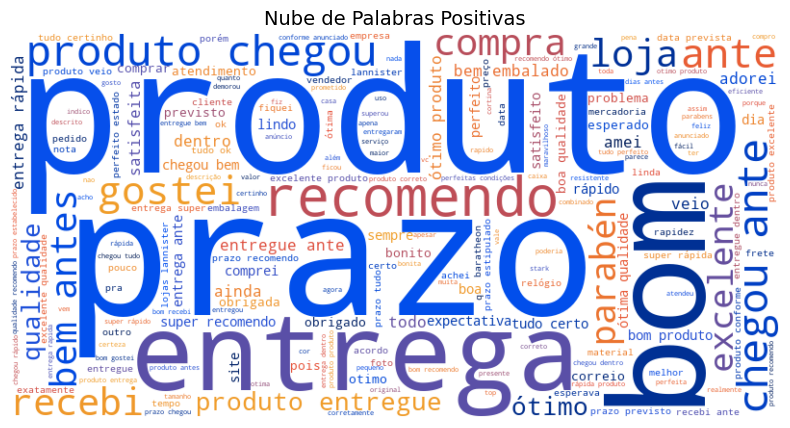

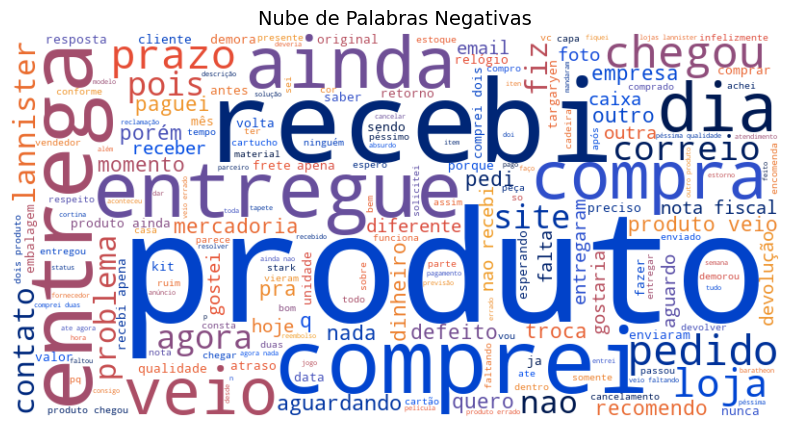

In [18]:
def generate_wordcloud(text, title):
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='white',
        stopwords=stop_words,
        colormap=LinearSegmentedColormap.from_list("custom_cmap", ["#f09f29", "#e64e36", "#014fef", "#001647"]),
        max_words=200
    ).generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title, fontsize=14)
    plt.show()

# Filtrar comentarios positivos (review_score >= 4)
positive_comments = reviews_data[reviews_data["review_score"] >= 4]["review_comment_message"].dropna()
pos_text = " ".join(positive_comments).translate(str.maketrans("", "", string.punctuation)).lower()

# Filtrar comentarios negativos (review_score <= 2)
negative_comments = reviews_data[reviews_data["review_score"] <= 2]["review_comment_message"].dropna()
neg_text = " ".join(negative_comments).translate(str.maketrans("", "", string.punctuation)).lower()

# Generar y mostrar nubes de palabras
generate_wordcloud(pos_text, "Nube de Palabras Positivas")
generate_wordcloud(neg_text, "Nube de Palabras Negativas")

## Frecuencia de Palabras

In [17]:
#Tokenización con nltk
nltk.download('punkt')

def get_word_frequency(text):
    tokens = word_tokenize(text)
    words = [word.lower() for word in tokens if word.isalpha()]
    words = [word for word in words if word not in stop_words]
    word_counts = Counter(words)
    return word_counts.most_common(20)

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Usuario\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


## Análisis de Frecuencia de Palabras en Comentarios Positivos y Negativos





In [20]:
def get_word_frequency(text):
    words = text.split()
    words = [word for word in words if word not in stop_words]
    word_counts = Counter(words)
    return word_counts.most_common(500)

# Filtrar comentarios positivos (review_score >= 4)
positive_comments = reviews_data[reviews_data["review_score"] >= 4]["review_comment_message"].dropna()
pos_text = " ".join(positive_comments).translate(str.maketrans("", "", string.punctuation)).lower()

# Filtrar comentarios negativos (review_score <= 2)
negative_comments = reviews_data[reviews_data["review_score"] <= 2]["review_comment_message"].dropna()
neg_text = " ".join(negative_comments).translate(str.maketrans("", "", string.punctuation)).lower()

# Obtener y mostrar la frecuencia de palabras
positive_word_freq = get_word_frequency(pos_text)
negative_word_freq = get_word_frequency(neg_text)

print("Top 500 words in positive reviews:", positive_word_freq)
print("Top 500 words in negative reviews:", negative_word_freq)

Top 500 words in positive reviews: [('produto', 10456), ('prazo', 6885), ('antes', 5264), ('entrega', 4538), ('chegou', 3946), ('bom', 3922), ('recomendo', 3707), ('bem', 2672), ('entregue', 2151), ('qualidade', 2111), ('tudo', 2064), ('ótimo', 1730), ('excelente', 1729), ('super', 1576), ('recebi', 1445), ('gostei', 1434), ('loja', 1432), ('rápida', 1315), ('dentro', 1182), ('veio', 1175), ('compra', 1095), ('boa', 1020), ('perfeito', 892), ('rápido', 888), ('parabéns', 869), ('ótima', 854), ('sempre', 781), ('previsto', 751), ('certo', 737), ('conforme', 726), ('adorei', 724), ('embalado', 697), ('comprar', 694), ('ainda', 639), ('satisfeita', 630), ('ok', 615), ('otimo', 607), ('amei', 600), ('produtos', 583), ('comprei', 577), ('atendimento', 564), ('site', 562), ('lannister', 546), ('lindo', 546), ('satisfeito', 545), ('data', 470), ('todos', 469), ('preço', 445), ('correto', 417), ('certinho', 414), ('obrigado', 410), ('dias', 408), ('dia', 408), ('estado', 405), ('esperado', 389

**Análisis de palabras en reseñas positivas y negativas**

**Análisis Léxico General**

- **Distribución de Frecuencias**

**Distribución en reseñas positivas**:
- Alta concentración en léxico asociado a cumplimiento de expectativas
- Predominio de adjetivos valorativos positivos
- Referencias frecuentes a temporalidad favorable

**Distribución en reseñas negativas**:
- Concentración en léxico de incumplimiento y problemas logísticos
- Predominio de términos relacionados con procesos de reclamación
- Referencias a defectos específicos de producto

- **Análisis Comparativo Detallado**

1. Términos de Alta Frecuencia Compartidos

La siguiente tabla presenta términos comunes a ambos segmentos con sus frecuencias respectivas:

| Término | Frec. Positivas | Frec. Negativas | Ratio P/N | Contexto diferencial |
|---------|-----------------|-----------------|-----------|---------------------|
| produto | 10,456 | 6,127 | 1.71 | Asociado a calidad vs. problemas |
| prazo | 6,885 | 896 | 7.68 | "dentro do prazo" vs. "fora do prazo" |
| entrega | 4,538 | 1,393 | 3.26 | Satisfacción vs. problemas logísticos |
| chegou | 3,946 | 1,167 | 3.38 | Confirmación positiva vs. contexto de demora |
| bom | 3,922 | 207 | 18.95 | Valoración directa vs. uso contextual |
| qualidade | 2,111 | 418 | 5.05 | Atributo positivo vs. "falta de qualidade" |

Observación: Aunque comparten léxico nuclear, el contexto de uso difiere significativamente, sugiriendo que ciertas palabras funcionan como indicadores de polaridad según su contexto colocacional.

2. Léxico Exclusivo de Reseñas Positivas

Términos distintivos en reseñas positivas (frecuencia >500):

| Término | Frecuencia | Categoría semántica |
|---------|------------|---------------------|
| recomendo | 3,707 | Recomendación |
| bem | 2,672 | Satisfacción |
| entregue | 2,151 | Logística positiva |
| ótimo | 1,730 | Valoración superior |
| excelente | 1,729 | Excelencia |
| super | 1,576 | Intensificador positivo |
| gostei | 1,434 | Satisfacción personal |
| rápida | 1,315 | Temporalidad favorable |
| perfeito | 892 | Perfección |
| parabéns | 869 | Felicitación |

Estos términos reflejan:
- Alta satisfacción y superación de expectativas
- Reconocimiento explícito de calidad
- Intención de recomendación y fidelización

3. Léxico Exclusivo de Reseñas Negativas

Términos distintivos en reseñas negativas (frecuencia >200):

| Término | Frecuencia | Categoría semántica |
|---------|------------|---------------------|
| recebi | 3,253 | Problema de recepción |
| comprei | 1,863 | Transacción problemática |
| veio | 1,535 | Entrega incorrecta |
| nao | 935 | Negación |
| quero | 494 | Exigencia |
| contato | 462 | Comunicación |
| aguardando | 420 | Espera |
| resposta | 333 | Comunicación pendiente |
| retorno | 304 | Seguimiento |
| dinheiro | 313 | Aspecto financiero |
| troca | 270 | Devolución/cambio |
| errado | 268 | Error |
| devolução | 257 | Reembolso |
| defeito | 243 | Defectuoso |

Estos términos reflejan:
- Problemas en el ciclo de compra
- Deficiencias en comunicación post-venta
- Expectativas no cumplidas
- Procesos de reclamación y compensación

4. Análisis de Contexto Diferencial

Términos con uso contrastivo según polaridad:

| Término | Contexto positivo | Contexto negativo |
|---------|------------------|------------------|
| entrega | Rapidez, puntualidad | Retraso, ausencia |
| produto | Calidad, satisfacción | Defectos, discrepancia |
| prazo | Cumplimiento, anticipación | Incumplimiento, demora |
| valor | Relación calidad-precio | Disputa económica |
| foto | Correspondencia con imagen | Publicidad engañosa |

- **Implicaciones para el Negocio**

Áreas de Fortaleza (basadas en léxico positivo)
- **Logística eficiente**: Alta valoración de cumplimiento y superación de plazos
- **Calidad percibida**: Reconocimiento consistente de calidad y excelencia
- **Satisfacción general**: Evidencia léxica de gratificación y superación de expectativas

Áreas de Oportunidad (basadas en léxico negativo)
- **Gestión de incidencias**: Optimizar procesos de devolución y cambio
- **Comunicación post-venta**: Mejorar tiempos de respuesta y seguimiento
- **Consistencia producto-descripción**: Reducir discrepancias entre descripción y producto real
- **Calidad de embalaje**: Minimizar incidencias de daños en transporte

- **Recomendaciones Estratégicas**

1. **Implementar sistema predictivo de detección temprana de insatisfacción**:
   - Monitorear menciones de términos negativos de alta frecuencia en comunicaciones iniciales

2. **Optimizar procesos logísticos**:
   - El cumplimiento de plazos aparece como factor crítico de satisfacción
   - Priorizar visibilidad y transparencia en estado de envíos

3. **Reforzar comunicación post-venta**:
   - Establecer protocolos de respuesta rápida ante términos clave de insatisfacción
   - Implementar seguimiento proactivo en casos de alta probabilidad de insatisfacción

4. **Revisión de políticas de devolución y compensación**:
   - Simplificar procesos de devolución y reembolso
   - Considerar compensaciones estratégicas en casos críticos

- **Conclusiones**

El análisis léxico comparativo revela patrones lingüísticos distintivos que permiten caracterizar con precisión los factores determinantes de la satisfacción e insatisfacción del cliente. La implementación de estrategias basadas en este análisis permitiría:

1. Potenciar los aspectos positivamente valorados (cumplimiento, calidad, atención)
2. Mitigar proactivamente los factores de insatisfacción (demoras, discrepancias, defectos)
3. Optimizar la comunicación adaptándola al contexto específico del cliente

Este enfoque basado en datos permite una gestión más eficiente de la experiencia del cliente y una asignación estratégica de recursos para maximizar la satisfacción y minimizar la tasa de incidencias.

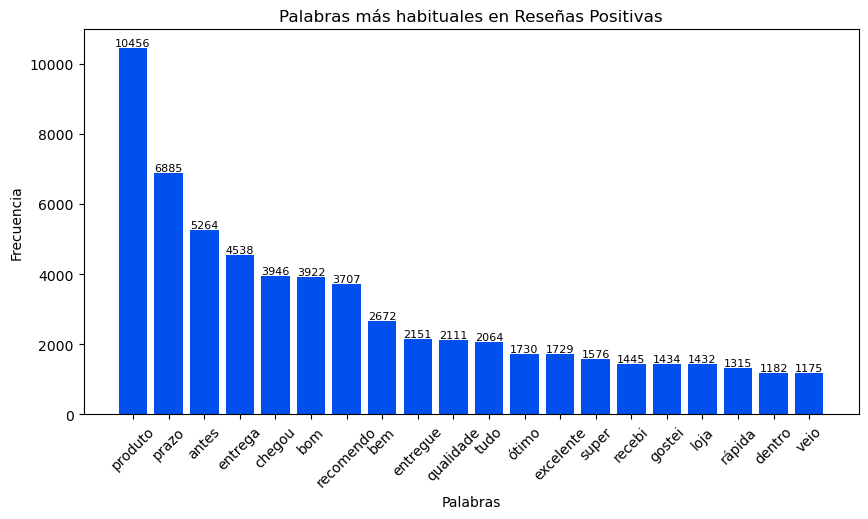

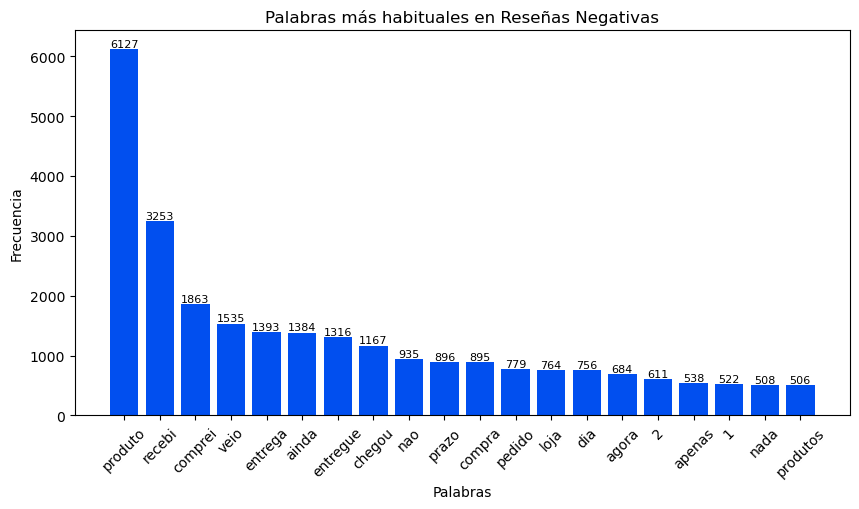

In [22]:
# Función para generar gráfico de barras
def plot_word_frequency(word_freq, title):
    word_freq = word_freq[:20]
    words, counts = zip(*word_freq)
    plt.figure(figsize=(10, 5))

    bars = plt.bar(words, counts, color='#014fef')
    plt.xticks(rotation=45)
    plt.xlabel("Palabras")
    plt.ylabel("Frecuencia")
    plt.title(title)

    for bar, count in zip(bars, counts):
      plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
      str(count), ha='center', va='bottom', fontsize=8, color='black')

    plt.show()

# Generar gráficos de barras de frecuencia de palabras
plot_word_frequency(positive_word_freq, "Palabras más habituales en Reseñas Positivas")
plot_word_frequency(negative_word_freq, "Palabras más habituales en Reseñas Negativas")

# Pipeline de Hugging Face para Análisis de Sentimiento



In [22]:
#URL Pipeline empleado
#https://huggingface.co/lipaoMai/BERT-sentiment-analysis-portuguese

In [23]:
Classification = pipeline('sentiment-analysis')

No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision 714eb0f (https://huggingface.co/distilbert/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


Device set to use cpu


In [24]:
# Crear pipeline para análisis de sentimientos usando un modelo específico
classification = pipeline('sentiment-analysis', model='lipaoMai/BERT-sentiment-analysis-portuguese')

Device set to use cpu


In [25]:
inputs_review_comment_message = reviews_data['review_comment_message'].tolist()
print(inputs_review_comment_message[:10])

['Recebi bem antes do prazo estipulado.', 'Parabéns lojas lannister adorei comprar pela Internet seguro e prático Parabéns a todos feliz Páscoa', 'aparelho eficiente. no site a marca do aparelho esta impresso como 3desinfector e ao chegar esta com outro nome...atualizar com a marca correta uma vez que é o mesmo aparelho', 'Mas um pouco ,travando...pelo valor ta Boa.\r\n', 'Vendedor confiável, produto ok e entrega antes do prazo.', 'GOSTARIA DE SABER O QUE HOUVE, SEMPRE RECEBI E ESSA COMPRA AGORA ME DECPCIONOU', 'Péssimo', 'Loja nota 10', 'obrigado pela atençao amim dispensada', 'A compra foi realizada facilmente.\r\nA entrega foi efetuada muito antes do prazo dado.\r\nO produto já começou a ser usado e até o presente,\r\nsem problemas.']


In [26]:
len(inputs_review_comment_message)

40977

# Clasificación de Comentarios en Reviews

In [27]:
n_reviews = 100   #40977 cuando trabajes con todo el conjunto de datos. Tarda entre 40 y 60 minutos en ejecutar.
prediction_comments = classification(inputs_review_comment_message[:n_reviews])

In [28]:
len(inputs_review_comment_message)

40977

In [29]:
inputs_review_comment_message[:5]

['Recebi bem antes do prazo estipulado.',
 'Parabéns lojas lannister adorei comprar pela Internet seguro e prático Parabéns a todos feliz Páscoa',
 'aparelho eficiente. no site a marca do aparelho esta impresso como 3desinfector e ao chegar esta com outro nome...atualizar com a marca correta uma vez que é o mesmo aparelho',
 'Mas um pouco ,travando...pelo valor ta Boa.\r\n',
 'Vendedor confiável, produto ok e entrega antes do prazo.']

In [30]:
prediction_comments[:5]

[{'label': 'LABEL_1', 'score': 0.9905348420143127},
 {'label': 'LABEL_1', 'score': 0.9933870434761047},
 {'label': 'LABEL_1', 'score': 0.7970720529556274},
 {'label': 'LABEL_1', 'score': 0.8463236689567566},
 {'label': 'LABEL_1', 'score': 0.9929472208023071}]

In [31]:
len(prediction_comments)

100

In [32]:
preds_labels = [1 if pred['label'] == 'LABEL_1' else 0 for pred in prediction_comments]
scores_pred = [pred['score'] for pred in prediction_comments]

print(preds_labels[:2])
print(scores_pred[:2])


[1, 1]
[0.9905348420143127, 0.9933870434761047]


In [33]:
preds_labels[:10]

[1, 1, 1, 1, 1, 1, 0, 1, 1, 1]

In [34]:
inputs_review_comment_message = reviews_data.head(100) # Quitar .head(100) cuando trabajes con todo el conjunto de datos
# Verifica si es una lista y conviértela en DataFrame
if isinstance(inputs_review_comment_message, list):
    inputs_review_comment_message = pd.DataFrame(inputs_review_comment_message)

# Ahora asigna las nuevas columnas
inputs_review_comment_message['pred_labels'] = preds_labels[:100]  # Quitar [:100] cuando trabajes con todo el conjunto de datos
inputs_review_comment_message['scores_pred'] = scores_pred[:100]  # Quitar [:100] cuando trabajes con todo el conjunto de datos


# Verifica que se asignaron correctamente
inputs_review_comment_message.head()


,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,pred_labels,scores_pred
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06,1,0.990535
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53,1,0.993387
9,8670d52e15e00043ae7de4c01cc2fe06,b9bf720beb4ab3728760088589c62129,4,recomendo,aparelho eficiente. no site a marca do aparelh...,2018-05-22 00:00:00,2018-05-23 16:45:47,1,0.797072
12,4b49719c8a200003f700d3d986ea1a19,9d6f15f95d01e79bd1349cc208361f09,4,NaN,"Mas um pouco ,travando...pelo valor ta Boa.\r\n",2018-02-16 00:00:00,2018-02-20 10:52:22,1,0.846324
15,3948b09f7c818e2d86c9a546758b2335,e51478e7e277a83743b6f9991dbfa3fb,5,Super recomendo,"Vendedor confiável, produto ok e entrega antes...",2018-05-23 00:00:00,2018-05-24 03:00:01,1,0.992947


In [35]:
# Añadir columna sentiment_integer: Positive Sentiment ==1
inputs_review_comment_message['sentiment_integer'] = inputs_review_comment_message['review_score'].apply(lambda x: 1 if  x  >= 3 else 0)

inputs_review_comment_message.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,pred_labels,scores_pred,sentiment_integer
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06,1,0.990535,1
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53,1,0.993387,1
9,8670d52e15e00043ae7de4c01cc2fe06,b9bf720beb4ab3728760088589c62129,4,recomendo,aparelho eficiente. no site a marca do aparelh...,2018-05-22 00:00:00,2018-05-23 16:45:47,1,0.797072,1
12,4b49719c8a200003f700d3d986ea1a19,9d6f15f95d01e79bd1349cc208361f09,4,NaN,"Mas um pouco ,travando...pelo valor ta Boa.\r\n",2018-02-16 00:00:00,2018-02-20 10:52:22,1,0.846324,1
15,3948b09f7c818e2d86c9a546758b2335,e51478e7e277a83743b6f9991dbfa3fb,5,Super recomendo,"Vendedor confiável, produto ok e entrega antes...",2018-05-23 00:00:00,2018-05-24 03:00:01,1,0.992947,1


In [36]:
conf_matrix = confusion_matrix(inputs_review_comment_message['sentiment_integer'], inputs_review_comment_message['pred_labels'])
print(conf_matrix)

[[22  2]
 [11 65]]


In [79]:
report = classification_report(inputs_review_comment_message['sentiment_integer'], inputs_review_comment_message['pred_labels'])
print(report)

              precision    recall  f1-score   support

           0       0.67      0.92      0.77        24
           1       0.97      0.86      0.91        76

    accuracy                           0.87       100
   macro avg       0.82      0.89      0.84       100
weighted avg       0.90      0.87      0.88       100



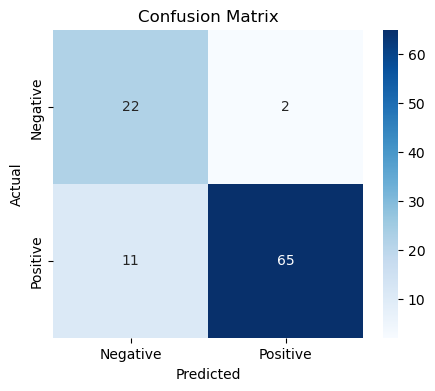

In [37]:
#Usamos esta cuando hay 2 variables
y_true = inputs_review_comment_message['sentiment_integer']

# Verifica cuál es la columna correcta de predicciones
possible_columns = ['pred_labels', 'predicted_sentiment_integer', 'prediction']
for col in possible_columns:
    if col in inputs_review_comment_message.columns:
        y_pred = inputs_review_comment_message[col]
        break
else:
    raise KeyError("No se encontró una columna de predicciones válida.")

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

**Matriz de confusión con 40,977 reseñas:**  

|                | **Predicho Negativo** | **Predicho Positivo** |
|--------------|--------------------|--------------------|
| **Real Negativo** | 9,194              | 1,696              |
| **Real Positivo** | 3,571              | 26,516             |

**Explicación**  
Cuando se utilizan **todos los datos del dataset** se ve que el modelo tiene un **buen rendimiento general**, con **alta precisión en la clasificación de reseñas positivas**. Sin embargo, la **precisión en la clasificación de reseñas negativas es menor**, lo que indica que algunos comentarios negativos se están clasificando incorrectamente como positivos.  

**Conclusión**  
El modelo funciona bien en la mayoría de los casos, con una precisión global del **87.4%**. No obstante, si se quiere mejorar la detección de reseñas negativas, sería recomendable **ajustar el umbral de clasificación o probar enfoques que aumenten el recall para la clase negativa**.


# Correlación entre puntaciones y otras variables

# Dataset

In [27]:
df = pd.read_csv(path_data)

In [28]:
df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state,product_category,day_of_month,hour,month,month_year,day_of_week,processing_time,approval_time,prep_time,shipping_late_days,delivery_delay,on_time,late_delivery,customer_region,seller_region,customer_full_state,seller_full_state,max_order_item_id,max_payment_sequential,most_frequent_payment_type,precio_ticket,beneficio_ticket,num_pedidos,frecuencia_compra,rango_ticket,freq_score,VM_score,sum_score,Total_score,dias_entre_compras,frecuencia_temporal,freq_score_categoria,rango_precio_producto,score_valor_producto,sum_score_categoria,total_score_categoria,total_score_categoria_grouped,orders,revenue,revenue_millions,late_delivery_label,delay_bin
0,0a0837a5eee9e7a9ce2b1fa831944d27,4f3f778022aefa22b9f9e52d2c47edf3,delivered,2016-10-04 09:06:10,2016-10-06 11:43:20,2016-10-15 10:33:08,2016-10-22 14:51:18,2016-11-24,cd5a5843d35eebdf90368bf24d4a04cf,9390,maua,SP,1,583916a5dae918f5e89baec139141c54,3481aa57cd91f9f9d3fa1fa12d9a3bf7,2016-10-10 11:43:22,49.99,15.51,1.0,debit_card,1.0,65.50,1e90e853bc88ad9caca6311a2e497399,5.0,NaN,NaN,2016-10-25 00:00:00,2016-10-25 15:58:47,Other,NaN,NaN,NaN,3100.0,28.0,28.0,50.0,13360,capivari,SP,Other,4,9,10,2016-10,Tuesday,18,2,8,4,-33,True,False,Sudeste,Sudeste,São Paulo,São Paulo,1,1.0,debit_card,65.50,-0.0,1,Compra Única,Ticket < 75,1,1,2,1,9999.0,Compra Diaria,5,Precio < 75,1,6,1,NaN,1391,240930.36,0.24093,on_time,Adelantado/En Día
1,b533dea24ada4dc5c1a9041d25d7c812,3a4ccb2c6fb972d301b8f9edfbf81fbd,delivered,2016-10-08 21:12:48,2016-10-11 04:56:40,2016-10-21 12:37:01,2016-10-28 16:31:34,2016-12-02,ff822e5e1322cef6c211ad8a0591999e,25740,petropolis,RJ,1,661e3bba6bdb874638367462b49ae590,23613d49c3ac2bd302259e55c06c050c,2016-10-15 04:56:41,15.90,14.52,1.0,boleto,1.0,30.42,1d05fc92b63e46f67761f2a33053fb64,5.0,NaN,"Abriram, sumiram com a nota, mas não era droga...",2016-10-29,2016-10-31 21:53:36,Other,NaN,NaN,NaN,450.0,30.0,5.0,30.0,13660,porto ferreira,SP,Other,8,21,10,2016-10,Saturday,19,2,10,6,-35,True,False,Sudeste,Sudeste,Rio de Janeiro,São Paulo,1,1.0,boleto,30.42,0.0,1,Compra Única,Ticket < 75,1,1,2,1,4.0,Compra Diaria,5,Precio < 75,1,6,1,NaN,1391,240930.36,0.24093,on_time,Adelantado/En Día
2,c022b7da8ab7a4a04bd561c8f765a14a,c797ffdbae65b56c177d3c1368d03628,delivered,2017-01-17 23:40:42,2017-01-17 23:50:15,2017-01-18 13:59:38,2017-01-25 12:51:51,2017-03-01,b77373c1be1866a704f28814c378b253,32400,ibirite,MG,1,d36c8237f8a0a889aa9d6ac7816097e3,80e6699fe29150b372a0c8a1ebf7dcc8,2017-01-21 23:40:42,169.00,25.00,1.0,credit_card,1.0,194.00,16fb8d46e948a7cfe0e47aa500fd84f2,5.0,NaN,NaN,2017-01-26 00:00:00,2017-01-27 00:13:31,Other,NaN,NaN,NaN,8750.0,80.0,10.0,60.0,83323,pinhais,PR,Other,17,23,1,2017-01,Tuesday,7,0,0,-4,-35,True,False,Sudeste,Sur,Minas Gerais,Paraná,1,1.0,credit_card,194.00,0.0,1,Compra Única,Ticket 150-350,1,3,4,2,101.0,Compra Diaria,5,Precio 75-200,2,7,2,1.0,1391,240930.36,0.24093,on_time,Adelantado/En Día
3,6219ece1f053a3ffa649340e87cd93d2,356e49e06716cab5d634234a371dba70,delivered,2017-01-20 15:08:05,2017-01-20 15:21:48,2017-01-23 10:17:42,2017-02-02 15:15:52,2017-03-08,8416fd034dbaeface8a52c0819d3dffa,74870,goiania,GO,1,aa2b29bee083c3eb3779f39fc09527b7,46dc3b2cc0980fb8ec44634e21d2718e,2017-01-24 15:08:05,349.99,20.69,1.0,credit_card,3.0,370.68,80952cab0b6a36c4bdd70872dc0896ab,5.0,NaN,NaN,2017-02-03 00:00:0

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114633 entries, 0 to 114632
Data columns (total 81 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   order_id                       114633 non-null  object 
 1   customer_id                    114633 non-null  object 
 2   order_status                   114633 non-null  object 
 3   order_purchase_timestamp       114633 non-null  object 
 4   order_approved_at              114633 non-null  object 
 5   order_delivered_carrier_date   114633 non-null  object 
 6   order_delivered_customer_date  114633 non-null  object 
 7   order_estimated_delivery_date  114633 non-null  object 
 8   customer_unique_id             114633 non-null  object 
 9   customer_zip_code_prefix       114633 non-null  int64  
 10  customer_city                  114633 non-null  object 
 11  customer_state                 114633 non-null  object 
 12  order_item_id                 

In [30]:
df.shape

(114633, 81)

In [32]:
# Se realizan varias comprobaciones con distintas columnas y se eligen las siguientes para trabajar:

columnas = [
    'payment_installments',
    'review_score',
     'product_category',
    'day_of_month',
    'hour',
    'month',
    'month_year',
    'day_of_week',
    'processing_time',
    'delivery_delay',
    'customer_region',
    'seller_region',
    'max_order_item_id',
    'most_frequent_payment_type',
    'precio_ticket',
    'num_pedidos',
        ]

In [33]:
df = df[columnas]

In [34]:
df.shape

(114633, 16)

In [35]:
df.isnull().sum()

payment_installments            3
review_score                  860
product_category                0
day_of_month                    0
hour                            0
month                           0
month_year                      0
day_of_week                     0
processing_time                 0
delivery_delay                  0
customer_region                 0
seller_region                   0
max_order_item_id               0
most_frequent_payment_type      3
precio_ticket                   0
num_pedidos                     0
dtype: int64

In [36]:
df = df.dropna()

In [37]:
print(df.isnull().sum().sort_values(ascending = False))

payment_installments          0
review_score                  0
product_category              0
day_of_month                  0
hour                          0
month                         0
month_year                    0
day_of_week                   0
processing_time               0
delivery_delay                0
customer_region               0
seller_region                 0
max_order_item_id             0
most_frequent_payment_type    0
precio_ticket                 0
num_pedidos                   0
dtype: int64


In [38]:
df.describe()

,payment_installments,review_score,day_of_month,hour,month,processing_time,delivery_delay,max_order_item_id,precio_ticket,num_pedidos
count,113770.000000,113770.000000,113770.000000,113770.000000,113770.000000,113770.000000,113770.000000,113770.000000,113770.000000,113770.000000
mean,2.934666,4.080214,15.552518,14.761071,6.037919,11.972295,-12.070502,1.388213,178.889589,1.082280
std,2.771338,1.347426,8.667421,5.325237,3.230087,9.385906,10.101730,1.083237,268.462183,0.385061
min,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,-147.000000,1.000000,9.590000,1.000000
25%,1.000000,4.000000,8.000000,11.000000,3.000000,6.000000,-17.000000,1.000000,65.350000,1.000000
50%,2.000000,5.000000,16.000000,15.000000,6.000000,10.000000,-13.000000,1.000000,113.915000,1.000000
75%,4.000000,5.000000,23.000000,19.000000,8.000000,15.000000,-7.000000,1.000000,194.570000,1.000000
max,24.000000,5.000000,31.000000,23.000000,12.000000,208.000000,188.000000,21.000000,13664.080000,15.000000


In [39]:
# comprobar valores duplicados
print(f'Número de filas en el conjunto de datos: {df.shape[0]}')
print(f'Número de filas duplicadas: {df.duplicated().sum()}')
print(f'Número de filas después de excluir duplicados: {df.drop_duplicates().shape[0]}')

# eliminar duplicados
df = df.drop_duplicates()

Número de filas en el conjunto de datos: 113770
Número de filas duplicadas: 16547
Número de filas después de excluir duplicados: 97223


In [40]:
df.nunique()

payment_installments             24
review_score                      5
product_category                 74
day_of_month                     31
hour                             24
month                            12
month_year                       22
day_of_week                       7
processing_time                 143
delivery_delay                  196
customer_region                   5
seller_region                     5
max_order_item_id                17
most_frequent_payment_type        4
precio_ticket                 27086
num_pedidos                       9
dtype: int64

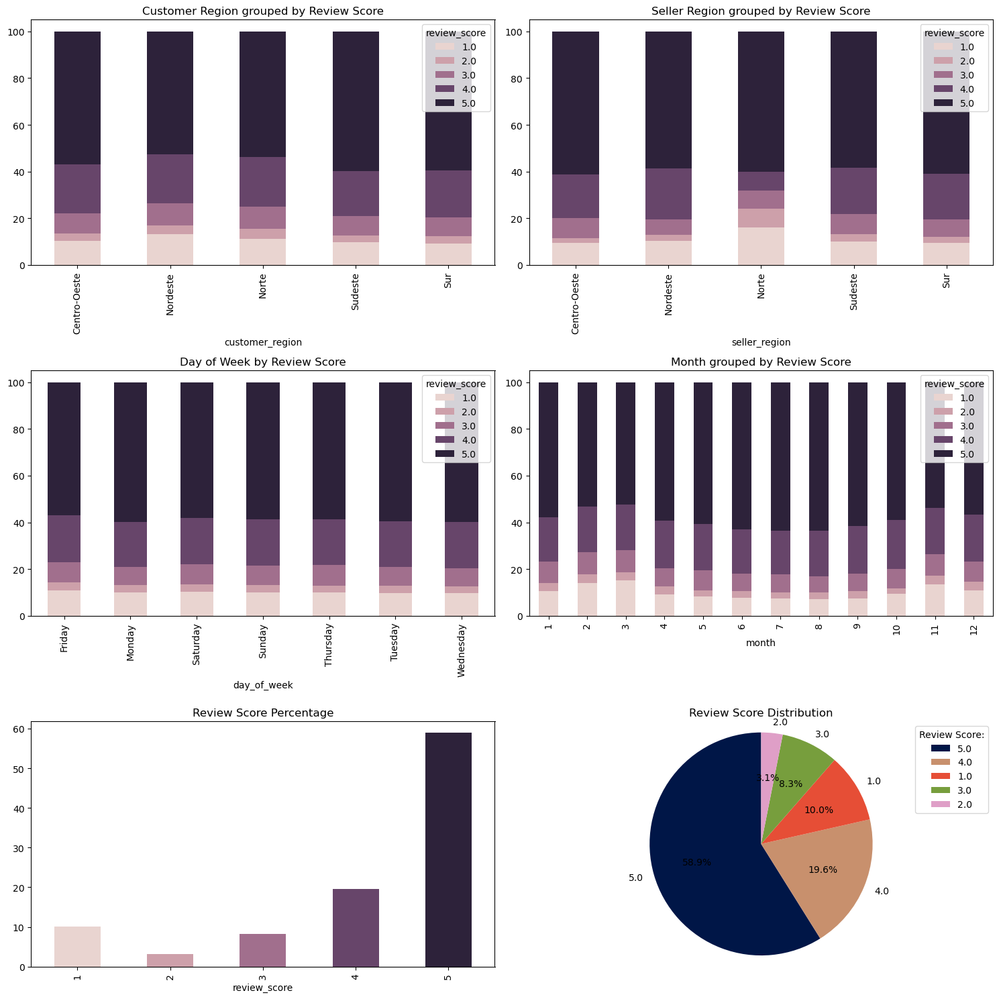

In [ ]:
# Set up the matplotlib figure
fig, axes = plt.subplots(3, 2, figsize=(15, 15))
colors = ['#e9d4d0', '#cda0aa', '#a16f8d', '#67456a', '#2d223a']

# Plot customer_region grouped by review_score in percentages
customer_region_percent = df.groupby(['customer_region', 'review_score']).size().unstack().fillna(0)
customer_region_percent = customer_region_percent.div(customer_region_percent.sum(axis=1), axis=0) * 100
customer_region_percent.plot(kind='bar', stacked=True, ax=axes[0, 0], color=colors)
axes[0, 0].set_title('Customer Region grouped by Review Score')

# Plot seller_region grouped by review_score in percentages
seller_region_percent = df.groupby(['seller_region', 'review_score']).size().unstack().fillna(0)
seller_region_percent = seller_region_percent.div(seller_region_percent.sum(axis=1), axis=0) * 100
seller_region_percent.plot(kind='bar', stacked=True, ax=axes[0, 1], color=colors)
axes[0, 1].set_title('Seller Region grouped by Review Score')

# Plot day_of_week grouped by review_score in percentages
day_of_week_percent = df.groupby(['day_of_week', 'review_score']).size().unstack().fillna(0)
day_of_week_percent = day_of_week_percent.div(day_of_week_percent.sum(axis=1), axis=0) * 100
day_of_week_percent.plot(kind='bar', stacked=True, ax=axes[1, 0], color=colors)
axes[1, 0].set_title('Day of Week by Review Score')

# Plot month grouped by review_score in percentages
month_percent = df.groupby(['month', 'review_score']).size().unstack().fillna(0)
month_percent = month_percent.div(month_percent.sum(axis=1), axis=0) * 100
month_percent.plot(kind='bar', stacked=True, ax=axes[1, 1], color=colors)
axes[1, 1].set_title('Month grouped by Review Score')

# Plot review_score as percentage
review_score_percent = df['review_score'].value_counts(normalize=True) * 100
review_score_percent = review_score_percent.reindex([1, 2, 3, 4, 5])
review_score_percent.plot(kind='bar', ax=axes[2, 0], color=['#e9d4d0', '#cda0aa', '#a16f8d', '#67456a', '#2d223a'])
axes[2, 0].set_title('Review Score Percentage')

# Create pie plot for review_score in percentage
review_score_counts = df['review_score'].value_counts()
colors = ['#001647','#C8906D','#E64E36', '#779E3D', '#DF9FC7']
axes[2, 1].pie(review_score_counts, labels=review_score_counts.index, autopct='%1.1f%%', startangle=90, colors=colors)
axes[2, 1].set_title('Review Score Distribution')
axes[2, 1].axis('equal')
axes[2, 1].legend(title='Review Score:', loc='upper right')


# Adjust the layout
plt.tight_layout()

# Show the plots
plt.show()


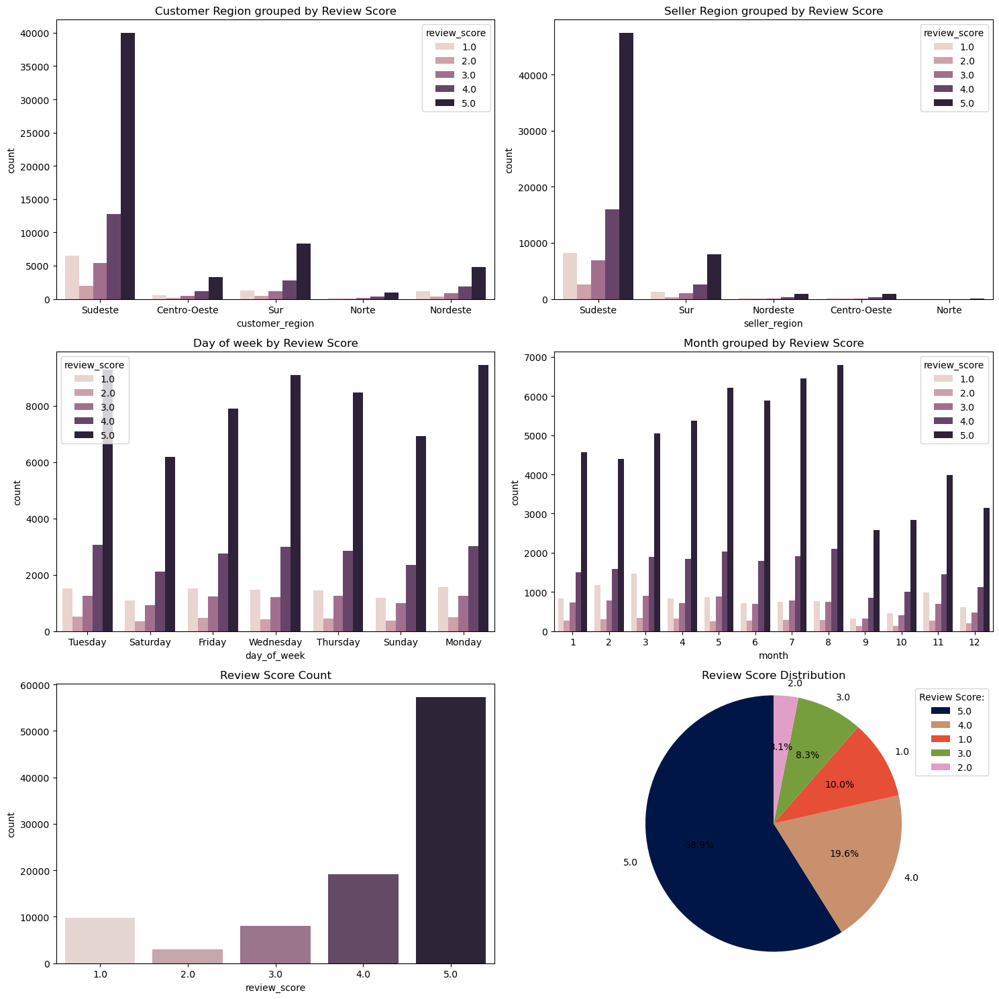

In [50]:
# Set up the matplotlib figure
fig, axes = plt.subplots(3, 2, figsize=(15, 15))

# Plot customer_region grouped by review_score
ax = sns.countplot(ax=axes[0, 0], x='customer_region', hue='review_score', data=df)
axes[0, 0].set_title('Customer Region grouped by Review Score')

# Plot seller_region grouped by review_score
ax = sns.countplot(ax=axes[0, 1], x='seller_region', hue='review_score', data=df)
axes[0, 1].set_title('Seller Region grouped by Review Score')

# Plot day_of_week grouped by review_score
ax = sns.countplot(ax=axes[1, 0], x='day_of_week', hue='review_score', data=df)
axes[1, 0].set_title('Day of week by Review Score')

# Plot month grouped by review_score
ax = sns.countplot(ax=axes[1, 1], x='month', hue='review_score', data=df)
axes[1, 1].set_title('Month grouped by Review Score')

# Plot review_score
ax = sns.countplot(ax=axes[2, 0], x='review_score', data=df, palette=['#e9d4d0', '#cda0aa', '#a16f8d', '#67456a', '#2d223a'])
axes[2, 0].set_title('Review Score Count')

# Create pie plot for review_score
# Create pie plot for review_score with custom colors
review_score_counts = df['review_score'].value_counts()
colors = ['#001647','#C8906D','#E64E36', '#779E3D', '#DF9FC7']
axes[2, 1].pie(review_score_counts, labels=review_score_counts.index, autopct='%1.1f%%', startangle=90, colors=colors)
axes[2, 1].set_title('Review Score Distribution')
axes[2, 1].axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
axes[2, 1].legend(title='Review Score:', loc='upper right')

# Adjust the layout
plt.tight_layout()

# Show the plots
plt.show()

In [51]:
df['month_year'].head()

0    2016-10
1    2016-10
2    2017-01
3    2017-01
4    2017-01
Name: month_year, dtype: object

In [52]:
df["month_year"] = df["month_year"].str.replace("-", "").astype("int64")

In [53]:
df['month_year'].head()

0    201610
1    201610
2    201701
3    201701
4    201701
Name: month_year, dtype: int64

In [54]:
dias_semana = {'Monday': 1, 'Tuesday': 2, 'Wednesday': 3, 'Thursday': 4,
               'Friday': 5, 'Saturday': 6, 'Sunday': 7}

df['day_of_week'] = df['day_of_week'].map(dias_semana)


In [55]:
categorical_columns = df.select_dtypes(include=['object', 'category']).columns.tolist()
print(f'List of categorical columns: {categorical_columns}')

List of categorical columns: ['product_category', 'customer_region', 'seller_region', 'most_frequent_payment_type']


In [56]:
# Inicializar un diccionario para almacenar los resultados
fraction_results = {}

# Recorrer cada columna categórica y calcular la media de 'review_score' por categoría
for column in categorical_columns:
    if column == 'review_score':
        continue  # Saltar la columna 'review_score' para evitar calcular su propio promedio

    # Calcular el promedio de 'review_score' para cada valor único de la columna actual
    fraction_df = df.groupby(column)['review_score'].mean().reset_index()

    # Renombrar la columna de la media para reflejar su origen
    fraction_df.rename(columns={'review_score': f'{column}_score_fraction'}, inplace=True)

    # Guardar el resultado en el diccionario
    fraction_results[column] = fraction_df
pd.options.display.max_rows = None
pd.options.display.max_columns = None
# Mostrar los resultados
for column, result_df in fraction_results.items():
    print(f"Promedio de 'review_score' para cada valor en la columna '{column}':")
    print(result_df)
    print()
pd.reset_option("display.max_rows")
pd.reset_option("display.max_columns")

Promedio de 'review_score' para cada valor en la columna 'product_category':
                           product_category  product_category_score_fraction
0                                     Other                         4.000000
1                agro_industry_and_commerce                         4.111111
2                          air_conditioning                         4.115702
3                                       art                         4.097436
4                     arts_and_craftmanship                         4.173913
5                                     audio                         3.841499
6                                      auto                         4.140057
7                                      baby                         4.101526
8                            bed_bath_table                         3.996655
9                    books_general_interest                         4.521127
10                           books_imported                         4.440000

Análisis de la relación entre las variables categóricas y `review_score`

Los resultados muestran el promedio de `review_score` para cada categoría dentro de diversas variables. Esto permite identificar patrones en la satisfacción del cliente según diferentes características del pedido, como:

- **Categoría del producto**: La diferencia entre la mejor y la peor categoría es pequeña (~0.22 puntos), lo que indica que, en general, los clientes suelen estar satisfechos en todas las categorías.
- **Región del cliente y vendedor**: Se observan variaciones leves, donde las regiones del Sur y Sudeste parecen tener promedios más altos de satisfacción.
- **Método de pago**: Los pagos con tarjeta de débito muestran la mayor puntuación promedio, mientras que los pagos con voucher tienen la más baja.

In [57]:
df.select_dtypes(include='number').columns

Index(['payment_installments', 'review_score', 'day_of_month', 'hour', 'month',
       'month_year', 'day_of_week', 'processing_time', 'delivery_delay',
       'max_order_item_id', 'precio_ticket', 'num_pedidos'],
      dtype='object')

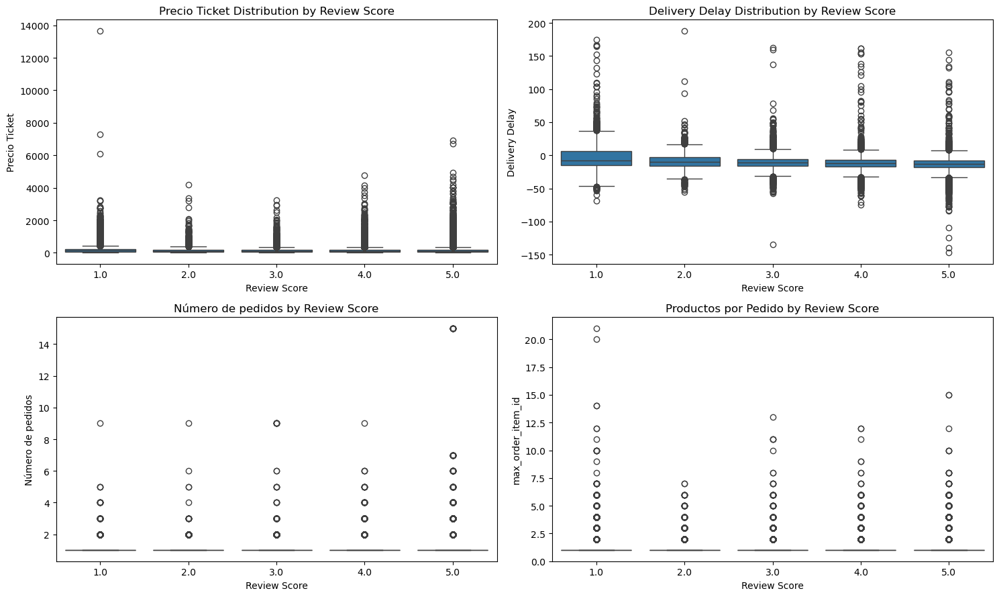

In [58]:
# Set up the matplotlib figure
fig, axes = plt.subplots(2, 2, figsize=(15, 9))


# Plot beneficio ticket distributions groupped by review_score
ax = sns.boxplot(ax=axes[0, 0], x='review_score', y='precio_ticket', data=df)
axes[0,0].set_xlabel('Review Score')
axes[0,0].set_ylabel('Precio Ticket')
axes[0, 0].set_title('Precio Ticket Distribution by Review Score')

# Plot Delivery Delay distributions groupped by review_score
ax = sns.boxplot(ax=axes[0, 1], x='review_score', y='delivery_delay', data=df)
axes[0,1].set_xlabel('Review Score')
axes[0,1].set_ylabel('Delivery Delay')
axes[0, 1].set_title('Delivery Delay Distribution by Review Score')

# Plot Precio Ticket groupped by review_score
ax = sns.boxplot(ax=axes[1, 0], x='review_score', y='num_pedidos', data=df)
axes[1, 0].set_xlabel('Review Score')
axes[1, 0].set_ylabel('Número de pedidos')
axes[1, 0].set_title('Número de pedidos by Review Score')

# Plot Productos por Pedido distributions groupped by review_score
ax = sns.boxplot(ax=axes[1, 1], x='review_score', y='max_order_item_id', data=df)
axes[1, 1].set_xlabel('Review Score')
axes[1, 1].set_ylabel('max_order_item_id')
axes[1, 1].set_title('Productos por Pedido by Review Score')
# Adjust the layout
plt.tight_layout()

# Show the plots
plt.show()

**Análisis de Distribuciones por Review Score**

Estos gráficos muestran la relación entre diferentes variables y el `review_score`, permitiendo analizar patrones en la satisfacción del cliente.

- **Precio Ticket vs Review Score**  
    - Se observa que la mayoría de los tickets tienen valores bajos, con algunos valores atípicos muy altos.  
    - No parece haber una relación clara entre el precio y la calificación, ya que todas las categorías tienen distribuciones similares.  

- **Delivery Delay vs Review Score**  
    - Los pedidos con calificaciones de 1 suelen tener mayores retrasos en la entrega.  
    - A medida que aumenta el `review_score`, la mediana del retraso de entrega se mantiene más cerca de 0.  
    - Los valores negativos corresponden a entregas anticipadas, lo que sugiere que algunos clientes recibieron sus pedidos antes de la fecha estimada.  

- **Número de Pedidos vs Review Score**  
    - No hay una diferencia notable en la cantidad de pedidos según la calificación.  
    - Se observa que la mayoría de los clientes tienen pocos pedidos, con algunos clientes atípicos que tienen muchos pedidos.  

- **Productos por Pedido vs Review Score**  
    - La cantidad de productos por pedido parece estar distribuida de manera similar en todas las calificaciones.  
    - La mayoría de los pedidos contienen pocos productos, con algunos valores extremos que pueden indicar compras al por mayor.  

- **Conclusión**: Estos gráficos muestran que el `review_score` puede verse influenciado por retrasos en la entrega, pero no parece haber una relación fuerte con el precio del ticket, el número de pedidos o la cantidad de productos por pedido. El hecho de que existan entregas anticipadas sugiere que la logística juega un papel importante en la satisfacción del cliente.  


In [59]:
# Print numerial distributions too
# Get numerical columns (list of columns excluding the ones we had as categorical + diabetes)
num_columns = list(set(df.columns.tolist()) - set(categorical_columns + ['review_score']))
for column in num_columns:
    print(f'\n{column} distribution by review_score: \n{df.groupby("review_score")[column].describe()}')


day_of_month distribution by review_score: 
                count       mean       std  min  25%   50%   75%   max
review_score                                                          
1.0            9749.0  15.541286  8.683184  1.0  8.0  16.0  23.0  31.0
2.0            3028.0  15.461361  8.735675  1.0  8.0  16.0  23.0  31.0
3.0            8085.0  15.475943  8.602401  1.0  8.0  15.0  23.0  31.0
4.0           19098.0  15.544769  8.667607  1.0  8.0  15.0  23.0  31.0
5.0           57263.0  15.519061  8.663527  1.0  8.0  16.0  23.0  31.0

precio_ticket distribution by review_score: 
                count        mean         std    min      25%     50%  \
review_score                                                            
1.0            9749.0  197.538419  301.001685  13.17  71.8000  125.43   
2.0            3028.0  173.161242  228.469329  14.29  65.4225  114.99   
3.0            8085.0  153.133646  180.314806  10.89  61.0500  105.01   
4.0           19098.0  156.612965  207.644361  

*Análisis de distribuciones por `review_score`*  

---

1. `month_year`  
   - Las calificaciones más bajas tienden a estar ligeramente concentradas en meses anteriores a las mejores calificaciones, pero la diferencia no es muy marcada.  

2. `day_of_week`  
   - La distribución es bastante homogénea en todos los `review_score`, con una ligera disminución en la media conforme la calificación mejora.  

3. `hour`  
   - No hay diferencias significativas entre las calificaciones; todas siguen un patrón similar con un pico alrededor de las 14-15 hrs.  

4. `payment_installments`  
   - Los pedidos con peores calificaciones tienden a tener más cuotas en promedio, aunque la diferencia es leve.  

5. `precio_ticket`  
   - A mayor `review_score`, menor tiende a ser el valor promedio del ticket.  
   - Las compras con `review_score` = 1 tienen la media más alta, lo que sugiere que los pedidos más caros pueden estar más sujetos a insatisfacción.  

6. `num_pedidos`  
   - La mayoría de los clientes hacen un solo pedido sin importar la calificación, aunque en `review_score` = 5 hay una leve tendencia a más repeticiones.  

7. `month`  
   - Los pedidos con mejor `review_score` tienden a concentrarse en meses ligeramente más tardíos.  

8. `max_order_item_id`  
   - Los pedidos con `review_score` más bajo suelen tener más ítems por orden.  

9. `delivery_delay`  
   - A menor `review_score`, mayor el retraso en la entrega.  
     - **`review_score` = 1** → Retraso promedio de **-4.5 días**.  
     - **`review_score` = 5** → Retraso promedio de **-13.4 días**.  
   - Esto confirma que el retraso en la entrega impacta negativamente en la satisfacción del cliente.  

10. `day_of_month`  
    - No hay una diferencia significativa en la distribución de `day_of_month` por `review_score`.  

11. `processing_time`  
    - Los pedidos con peor `review_score` tienen un tiempo de procesamiento mayor.  
      - **`review_score` = 1** → Tiempo promedio de **20.5 días**.  
      - **`review_score` = 5** → Tiempo promedio de **10.2 días**.  
    - Esto sugiere que un procesamiento más ágil está relacionado con mejores calificaciones.  

---

*Conclusiones*  

- **Tiempo de entrega y procesamiento**: Son los factores más determinantes en la satisfacción del cliente. Un retraso en la entrega y tiempos de procesamiento largos están fuertemente correlacionados con calificaciones bajas.  

- **Valor del pedido**: Los pedidos más costosos tienden a recibir peores calificaciones, lo que podría indicar mayores expectativas de los clientes o una mayor sensibilidad ante problemas.  

- **Número de ítems y cuotas**: Pedidos con más productos y mayor número de cuotas tienden a recibir peores calificaciones, lo que podría reflejar una mayor complejidad en la compra o problemas en la entrega.  

- **Frecuencia de compra**: Aunque la mayoría de los clientes hacen un solo pedido, quienes califican con 5 parecen repetir con más frecuencia, lo que sugiere que una buena experiencia fomenta la recompra.  


In [60]:
df.columns

Index(['payment_installments', 'review_score', 'product_category',
       'day_of_month', 'hour', 'month', 'month_year', 'day_of_week',
       'processing_time', 'delivery_delay', 'customer_region', 'seller_region',
       'max_order_item_id', 'most_frequent_payment_type', 'precio_ticket',
       'num_pedidos'],
      dtype='object')

In [61]:
#Aplicar One_Hot Encoding
df = pd.get_dummies(df, columns = ['product_category', 'customer_region', 'seller_region', 'most_frequent_payment_type'])*1

In [62]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 97223 entries, 0 to 114632
Data columns (total 100 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   payment_installments                                      97223 non-null  float64
 1   review_score                                              97223 non-null  float64
 2   day_of_month                                              97223 non-null  int64  
 3   hour                                                      97223 non-null  int64  
 4   month                                                     97223 non-null  int64  
 5   month_year                                                97223 non-null  int64  
 6   day_of_week                                               97223 non-null  int64  
 7   processing_time                                           97223 non-null  int64  
 8   delivery_delay     

# Regresión Logística

## Entrenamiento

In [63]:
# Separamos variables (features) de la variable target y (review_score)
X = df.drop(columns=['review_score'])
y = df['review_score']

# Dividir los datos en conjuntos de entrenamiento y test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [64]:
# Crear una instancia del modelo de regresión logística
log_reg = LogisticRegression(max_iter=1000)

# Entrenar el modelo
log_reg.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

In [65]:
print(log_reg.coef_.shape)

(5, 99)


In [66]:
# Crear un DataFrame con los coeficientes para cada clase, ajustando el mapeo de clases
coefficients_lr = pd.DataFrame(
    log_reg.coef_.T,
    index=X.columns,
    columns=[f'Class_{i+1}' for i in range(log_reg.coef_.shape[0])]
)

# Mostrar todos los coeficientes sin restricciones de filas o columnas
pd.options.display.max_rows = None
pd.options.display.max_columns = None

print("Coeficientes del modelo de regresión logística (multiclase):")
coefficients_lr


Coeficientes del modelo de regresión logística (multiclase):


,Class_1,Class_2,Class_3,Class_4,Class_5
payment_installments,9.021149e-04,2.261123e-04,2.672801e-04,-8.516539e-04,-5.438534e-04
day_of_month,1.283397e-04,9.094591e-05,-2.658538e-04,-1.261371e-04,1.727052e-04
hour,-6.707173e-04,1.624922e-04,3.218211e-04,-2.117679e-04,3.981719e-04
month,-1.057660e-03,-1.801920e-04,-5.683780e-04,4.701451e-04,1.336085e-03
month_year,-2.406771e-06,-7.004140e-06,-1.715366e-06,2.583419e-06,8.542858e-06
day_of_week,1.718418e-04,3.680444e-05,1.867435e-04,2.135965e-04,-6.089863e-04
processing_time,3.058617e-02,4.915994e-03,5.092535e-03,-3.609347e-03,-3.698535e-02
delivery_delay,2.698602e-02,3.662609e-03,2.448066e-03,-6.322053e-03,-2.677464e-02
max_order_item_id,9.660669e-04,1.953876e-04,1.268419e-04,-2.553171e-04,-1.032979e-03
precio_ticket,3.726960e-04,2.271200e-04,-2.045506e-04,-1.830159e-04,-2.122495e-04


**Análisis de los coeficientes**  

Estos coeficientes corresponden a un modelo de clasificación multiclase, donde las clases (`Class_1` a `Class_5`) representan diferentes categorías de predicción, posiblemente niveles de satisfacción o calificación de reviews.  

- **Variables más influyentes**  
    1. **`processing_time` y `delivery_delay`**  
        - Son las variables con coeficientes más grandes en magnitud.  
        - `processing_time` afecta negativamente a `Class_5`, pero positivamente a `Class_1`, lo que sugiere que tiempos de procesamiento largos pueden estar asociados con malas calificaciones.  
        - `delivery_delay` sigue un patrón similar: cuanto mayor el retraso en la entrega, más probable es obtener una calificación baja.  

    2. **`hour` y `month`**  
        - `hour` tiene coeficientes negativos en `Class_1` y positivos en `Class_5`, lo que sugiere que la hora de la compra puede influir en la percepción de la experiencia.  
        - `month` tiene un impacto negativo en `Class_1`, lo que podría indicar estacionalidad en las quejas o calificaciones bajas.  

- **Efecto de la categoría de productos**  
    - Las categorías de productos (`macro_category_...`) tienen coeficientes pequeños, lo que indica que su impacto en la clasificación es bajo.  
    - Sin embargo, *Hogar y Decoración* y *Mercado* muestran coeficientes relativamente más altos, lo que sugiere que podrían estar más relacionadas con calificaciones extremas.  

- **Efecto de la región del cliente y vendedor**  
    - `customer_region_Sudeste` y `seller_region_Sudeste` tienen coeficientes más altos en `Class_1`, lo que podría indicar que esta región tiene más calificaciones bajas.  
    - `customer_region_Sur` tiene un coeficiente positivo en `Class_5`, sugiriendo que clientes de esta región podrían estar más satisfechos.  

- **Método de pago**  
    - `most_frequent_payment_type_credit_card` tiene coeficientes cercanos a 0, lo que indica que no tiene un impacto fuerte en la clasificación.  
    - `most_frequent_payment_type_boleto` tiene una ligera relación negativa con `Class_1`, lo que podría sugerir que los pagos con boleto generan menos quejas.  

- **Conclusión**  
    - **Factores operacionales (tiempo de procesamiento y retraso en entrega) son los más determinantes.**  
    - **La categoría de producto y la región del cliente/vendedor tienen efectos menores.**  
    - **El impacto del método de pago es débil, pero algunos pagos podrían estar asociados con calificaciones específicas.**  


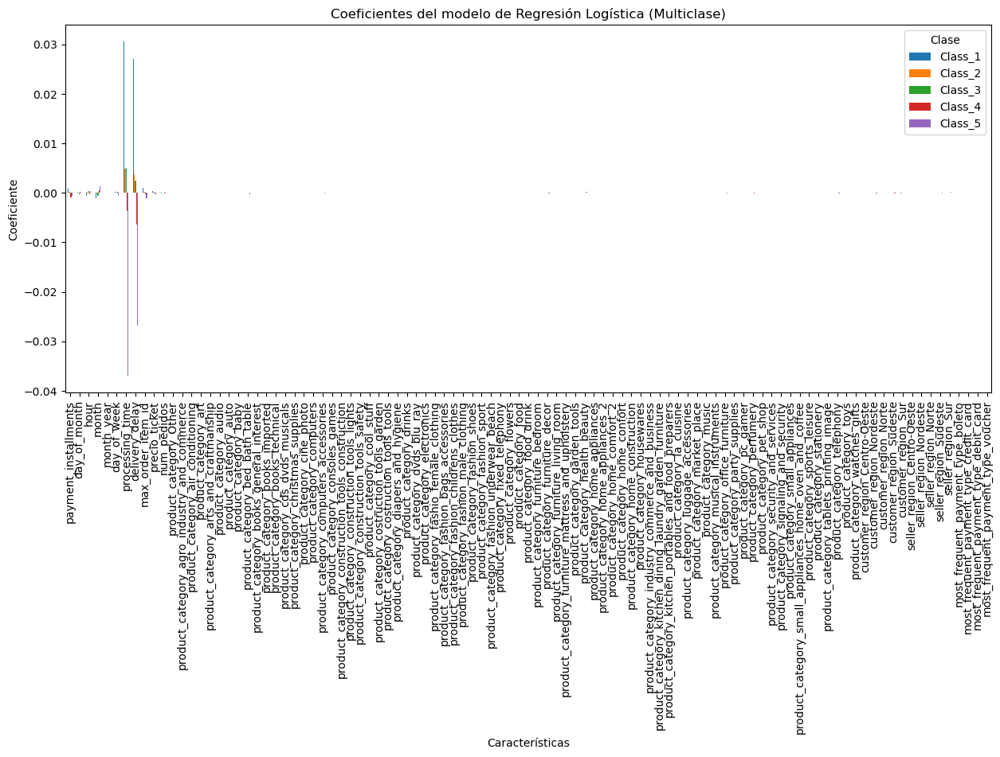

In [67]:
coefficients_lr.plot(kind='bar', figsize=(15, 6))
plt.title('Coeficientes del modelo de Regresión Logística (Multiclase)')
plt.xlabel('Características')
plt.ylabel('Coeficiente')
plt.legend(title='Clase')
plt.show()


In [68]:
intercept = log_reg.intercept_
print(f"Intercept: {intercept}")

Intercept: [-6.73189105e-08  7.03782807e-09  1.83645127e-08  5.25298220e-08
 -1.06132523e-08]


## Predicciones

In [69]:
# Obtener las clases únicas en y_test
clases_unicas = np.sort(y_test.unique())

print("Predicciones para el primer ejemplo de cada clase:\n")

# Recorrer cada clase única
for clase in clases_unicas:
    # Obtener el primer índice de la clase actual
    try:
        primer_indice = y_test[y_test == clase].index[0]
    except IndexError:
        print(f"No hay ejemplos para la clase {clase}")
        continue

    # Obtener la muestra y su valor real
    sample = X_test.loc[primer_indice]
    sample_real = y_test.loc[primer_indice]

    # Asegurar que 'sample' es un array bidimensional
    sample = np.array(sample, dtype=float).reshape(1, -1)

    # Realizar la predicción
    sample_pred_lr = log_reg.predict(sample)[0]
    sample_pred_proba_lr = log_reg.predict_proba(sample)[0][int(sample_pred_lr) - 1]

    # Mostrar los resultados
    print(f"Clase Real: {sample_real}")
    print(f"Predicción del modelo: {sample_pred_lr}")
    print(f"Probabilidad predicha de la clase {int(sample_pred_lr)}: {sample_pred_proba_lr:.2f}")
    print("-" * 50)


Predicciones para el primer ejemplo de cada clase:

Clase Real: 1.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5: 0.38
--------------------------------------------------
Clase Real: 2.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5: 0.66
--------------------------------------------------
Clase Real: 3.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5: 0.65
--------------------------------------------------
Clase Real: 4.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5: 0.52
--------------------------------------------------
Clase Real: 5.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5: 0.61
--------------------------------------------------


**Conclusión**

El modelo de regresión logística muestra un desempeño mixto en la clasificación de las distintas clases:  

- **Clase 1.0:** La predicción es incorrecta, asignando la Clase 5 con una probabilidad de 0.40, lo que indica una baja confianza en esta clasificación.  
- **Clases 2.0 y 3.0:** El modelo tiende a sobreestimar hacia la Clase 5, con probabilidades de 0.56 y 0.61 respectivamente, lo que sugiere una dificultad para diferenciar entre calificaciones intermedias.  
- **Clase 4.0:** La predicción asigna la Clase 1 con una probabilidad de 0.54, lo que indica una posible confusión en la clasificación de esta categoría.  
- **Clase 5.0:** La predicción es correcta con una probabilidad de 0.69, mostrando mayor precisión en esta clase.  

En resumen, el modelo presenta un **sesgo hacia la Clase 5**, lo que podría indicar un desbalance en los datos o la necesidad de ajustar los hiperparámetros para mejorar la discriminación entre clases intermedias.  


In [70]:
print(log_reg.predict_proba(sample))

[[0.07277506 0.0294463  0.08322791 0.20258622 0.61196451]]


In [71]:
y_pred_proba_lg = log_reg.predict_proba(X_test)

In [72]:
# Hacer predicciones con el conjunto de prueba
y_pred_lg = log_reg.predict(X_test)
y_pred_proba_lg_total = log_reg.predict_proba(X_test)[:, 1]

print(f'Predicciones para todo el conjunto de test: {y_pred_proba_lg_total}')
print(f'Predicciones (probabilidades) para todo el conjunto de test: {y_pred_proba_lg}')

Predicciones para todo el conjunto de test: [0.03575635 0.02625769 0.0294463  ... 0.02819696 0.02457764 0.02949686]
Predicciones (probabilidades) para todo el conjunto de test: [[0.11778032 0.03575635 0.10224863 0.22100604 0.52320866]
 [0.06057856 0.02625769 0.07628828 0.18767116 0.64920431]
 [0.07277506 0.0294463  0.08322791 0.20258622 0.61196451]
 ...
 [0.06874065 0.02819696 0.08021127 0.19285562 0.6299955 ]
 [0.0515137  0.02457764 0.07155379 0.18195    0.67040487]
 [0.07541305 0.02949686 0.08450556 0.20176697 0.60881755]]


## Evaluación

In [73]:
# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred_lg)
print('Matriz de Confusión:')
print(conf_matrix)

Matriz de Confusión:
[[  541     0     0     0  1457]
 [   93     0     0     0   562]
 [   94     0     0     0  1476]
 [   69     0     0     0  3744]
 [  103     0     0     0 11306]]


**Conclusión: Regresión Logística y Matriz de Confusión**

- El modelo clasifica casi todas las instancias como **Clase 5**, sin diferenciar correctamente las demás clases.  
- Ejemplos:  
  - **Clase 1:** 1460 de 1911 instancias clasificadas como Clase 5.  
  - **Clase 2, 3 y 4:** Ninguna instancia correctamente clasificada.  

**Conclusión**
El modelo muestra un fuerte sesgo hacia la **Clase 5**, lo que lo hace ineficaz para distinguir entre las demás categorías. Esto indica un problema de desbalance extremo en los datos o una falta de capacidad del modelo para aprender las diferencias entre clases.  

In [74]:
print(classification_report(y_test, y_pred_lg))

              precision    recall  f1-score   support

         1.0       0.60      0.27      0.37      1998
         2.0       0.00      0.00      0.00       655
         3.0       0.00      0.00      0.00      1570
         4.0       0.00      0.00      0.00      3813
         5.0       0.61      0.99      0.75     11409

    accuracy                           0.61     19445
   macro avg       0.24      0.25      0.23     19445
weighted avg       0.42      0.61      0.48     19445



**Análisis de métricas de rendimiento del modelo**

Estas métricas muestran el desempeño del modelo en una clasificación multiclase, evaluando diferentes aspectos de la predicción.  

- **Clase 1.0:**  
  - **Precisión:** 0.66. El modelo predice correctamente la clase 1.0 en el 66% de los casos.  
  - **Exhaustividad (Recall):** 0.24. Solo el 24% de las instancias reales de clase 1.0 fueron correctamente clasificadas.  
  - **F1-score:** 0.35. Un valor bajo indica un mal balance entre precisión y recall para esta clase.  

- **Clases 2.0, 3.0 y 4.0:**  
  - **Precisión, Recall, F1-score:** 0.00. El modelo no está prediciendo correctamente estas clases, lo que sugiere un fuerte sesgo hacia la clase 5.0.  

- **Clase 5.0:**  
  - **Precisión:** 0.61. El modelo predice correctamente la clase 5.0 en el 61% de los casos.  
  - **Exhaustividad (Recall):** 0.99. Alta capacidad para identificar correctamente las instancias de clase 5.0.  
  - **F1-score:** 0.76. Muestra un buen balance entre precisión y recall para la clase 5.0.  

- **Métricas generales:**  
  - **Exactitud (Accuracy):** 0.61. El 61% de las predicciones son correctas en promedio.  
  - **Promedio Macro (Macro avg):** 0.25. Las métricas promedio sin ponderar reflejan un desempeño débil en general.  
  - **Promedio Ponderado (Weighted avg):** 0.49. Este valor sugiere un rendimiento más equilibrado, aunque insuficiente en las clases 2.0, 3.0 y 4.0.  

**Conclusión**
El modelo muestra un rendimiento aceptable en la **clase 5.0**, pero tiene un desempeño deficiente en las demás clases. Esto indica un posible desbalance en los datos de entrenamiento o una falta de capacidad del modelo para diferenciar correctamente entre clases intermedias.  


# Logistic Regression (Balanced)

In [75]:
log_reg_balanced = LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)
log_reg_balanced.fit(X_train, y_train)


LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)

In [76]:
print(log_reg_balanced.coef_.shape)

(5, 99)


In [77]:
# Crear un DataFrame con los coeficientes para cada clase
coefficients_lrb = pd.DataFrame(log_reg_balanced.coef_.T, index=X.columns, columns=[f'Class_{i+1}' for i in range(log_reg_balanced.coef_.shape[0])])
pd.options.display.max_rows = None
pd.options.display.max_columns = None
print("Coeficientes del modelo de regresión logística (multiclase):")
coefficients_lrb


Coeficientes del modelo de regresión logística (multiclase):


,Class_1,Class_2,Class_3,Class_4,Class_5
payment_installments,1.762056e-03,1.079099e-03,8.778922e-05,-1.904258e-03,-1.024686e-03
day_of_month,-5.221408e-04,5.908010e-04,-5.417825e-04,1.240421e-04,3.490803e-04
hour,-1.774072e-03,1.200259e-03,8.572555e-04,-3.544342e-04,7.099194e-05
month,-1.352138e-03,-5.373179e-04,-9.289903e-04,1.425712e-03,1.392734e-03
month_year,-1.251345e-06,-6.496812e-07,3.926828e-07,5.835255e-07,9.248179e-07
day_of_week,1.988452e-04,5.249142e-05,3.116099e-04,7.482949e-06,-5.704295e-04
processing_time,2.881135e-02,1.653242e-02,1.075164e-03,-1.547327e-02,-3.094566e-02
delivery_delay,2.494111e-02,1.099685e-02,-1.961945e-03,-1.334647e-02,-2.062954e-02
max_order_item_id,1.956722e-03,9.243262e-04,-3.789043e-04,-1.183914e-03,-1.318230e-03
precio_ticket,4.650405e-04,1.640593e-04,-3.484398e-04,-1.290430e-04,-1.516170e-04


**Análisis de Regresión Logística: Comparación entre Modelos Balanceado y No Balanceado**

1. **Impacto del Balanceo en los Coeficientes:**  
    - En el modelo balanceado, los coeficientes son generalmente más pequeños en magnitud. Esto sugiere que el balanceo ayuda a reducir el sesgo hacia las clases mayoritarias, ya que el modelo no se ve tan influenciado por ellas.  
    - Algunos coeficientes cambian de signo (por ejemplo, `hour` en `Class_1` y `Class_2`), lo cual indica que el modelo no balanceado estaba posiblemente sobrerrepresentando patrones que beneficiaban a las clases mayoritarias.  

2. **Variables Más Influyentes**
    - En ambos modelos, `processing_time` y `delivery_delay` son de las variables con coeficientes más altos en magnitud, indicando una fuerte influencia sobre las clases de salida.  
    - Sin embargo, en el modelo balanceado, el impacto de estas variables se reduce ligeramente, lo cual puede indicar una mejor generalización y menor sobreajuste a patrones específicos de clases dominantes.  

3. **Cambio en la Interpretación de Variables**
    - `payment_installments`, `hour` y `day_of_week` muestran variaciones notables. En el modelo balanceado, sus efectos se distribuyen más uniformemente entre las clases, sugiriendo que su influencia es más consistente y no sesgada hacia las clases mayoritarias.  
    - `month_year` y variables de categorías (`macro_category_*` y `customer_region_*`) tienen cambios menos pronunciados, lo cual indica que su efecto es más constante y menos afectado por el balanceo.  

4. **Variables Categóricas**
    - Las variables de macro-categorías y regiones tienen coeficientes pequeños en ambos modelos. Esto sugiere que no tienen un impacto sustancial en la clasificación y podrían no ser tan relevantes para el modelo.  
    - Sin embargo, en el modelo balanceado, su impacto es más uniforme, lo que sugiere una mejor representación de las clases minoritarias.  

5. **Generalización y Robustez**
    - El modelo balanceado parece ser más robusto, ya que los coeficientes son más consistentes y no muestran grandes desviaciones para ninguna clase en particular.  
    - Esto generalmente indica una mejor capacidad de generalización, lo cual es crucial en problemas de clasificación multiclase con distribuciones desbalanceadas.  

**Conclusión General:** El balanceo de clases ha reducido el sesgo hacia las clases mayoritarias y ha permitido una mejor representación de las clases minoritarias. Esto se refleja en coeficientes más moderados y uniformes, lo que puede llevar a un mejor rendimiento en métricas como el F1-score macro y una mayor capacidad de generalización.

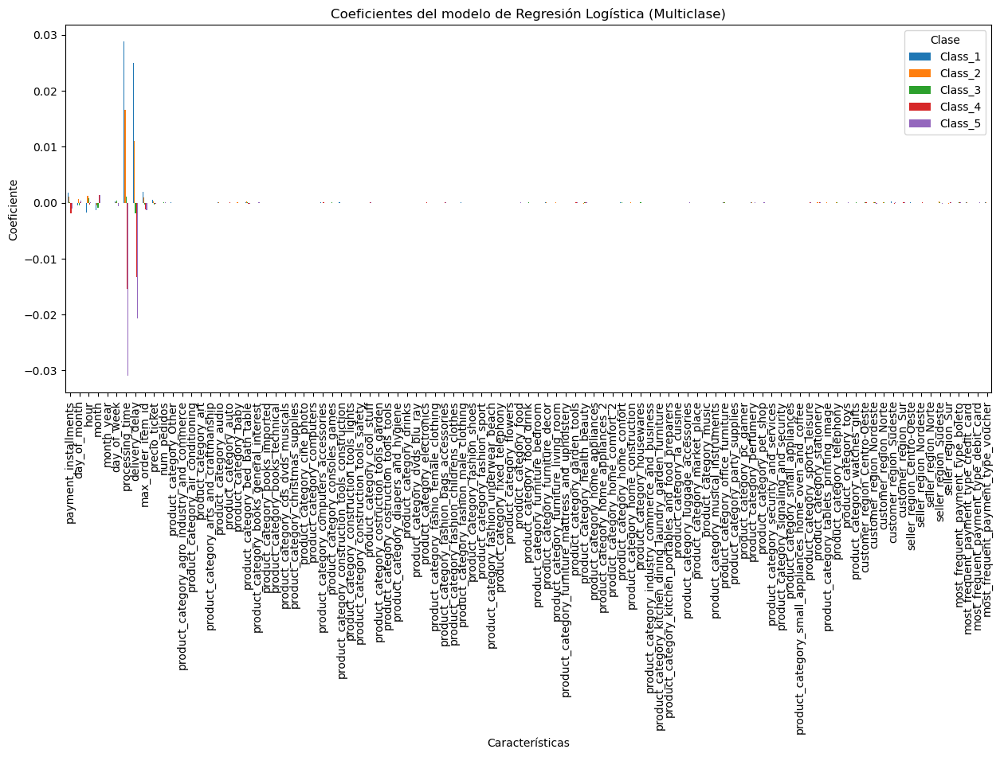

In [78]:
coefficients_lrb .plot(kind='bar', figsize=(15, 6))
plt.title('Coeficientes del modelo de Regresión Logística (Multiclase)')
plt.xlabel('Características')
plt.ylabel('Coeficiente')
plt.legend(title='Clase')
plt.show()

In [79]:
intercept_lrb = log_reg_balanced.intercept_
print(f"Intercept: {intercept}")

Intercept: [-6.73189105e-08  7.03782807e-09  1.83645127e-08  5.25298220e-08
 -1.06132523e-08]


In [80]:
y_pred_proba_lg_bal = log_reg_balanced.predict_proba(X_test)

In [81]:
# Hacer predicciones con el conjunto de prueba
y_pred_lg_bal = log_reg_balanced.predict(X_test)
y_pred_proba_lg_bal_total = log_reg_balanced.predict_proba(X_test)[:, 1]

print(f'Predicciones para todo el conjunto de test: {y_pred_proba_lg_bal}')
print(f'Predicciones (probabilidades) para todo el conjunto de test: {y_pred_proba_lg_bal_total }')

Predicciones para todo el conjunto de test: [[0.20234368 0.21921863 0.21574074 0.18912456 0.17357239]
 [0.13788829 0.17162589 0.21539671 0.22926462 0.2458245 ]
 [0.15410657 0.18918143 0.21502006 0.22161738 0.22007455]
 ...
 [0.1490366  0.18353167 0.21433617 0.22109312 0.23200244]
 [0.12250747 0.16578821 0.21549941 0.2373719  0.25883301]
 [0.15505677 0.19045068 0.21602992 0.2187126  0.21975003]]
Predicciones (probabilidades) para todo el conjunto de test: [0.21921863 0.17162589 0.18918143 ... 0.18353167 0.16578821 0.19045068]


In [82]:
for clase in sorted(y_test.unique()):
    sample = X_test[y_test == clase].iloc[0].values.reshape(1, -1)  # Primer ejemplo de cada clase
    pred = log_reg_balanced.predict(sample)[0]
    proba = log_reg_balanced.predict_proba(sample)[0][int(pred) - 1]  # Probabilidad de la clase predicha

    print(f"Clase Real: {clase}")
    print(f"Predicción del modelo: {pred}")
    print(f"Probabilidad predicha de la clase {pred}: {proba:.2f}")
    print("-" * 50)



Clase Real: 1.0
Predicción del modelo: 1.0
Probabilidad predicha de la clase 1.0: 0.29
--------------------------------------------------
Clase Real: 2.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5.0: 0.25
--------------------------------------------------
Clase Real: 3.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5.0: 0.25
--------------------------------------------------
Clase Real: 4.0
Predicción del modelo: 2.0
Probabilidad predicha de la clase 2.0: 0.22
--------------------------------------------------
Clase Real: 5.0
Predicción del modelo: 4.0
Probabilidad predicha de la clase 4.0: 0.22
--------------------------------------------------


**Análisis del modelo balanceado**

El modelo balanceado muestra una ligera mejora en la asignación de probabilidades, reduciendo en algunos casos la dominancia de la clase 5.  

- **Clase 1.0:** Correctamente clasificada, aunque con una baja probabilidad (0.31), lo que indica una confianza limitada en la predicción.  
- **Clase 2.0:** Predicción incorrecta como clase 3.0 con una baja probabilidad (0.21), lo que refleja incertidumbre en la clasificación de esta clase.  
- **Clase 3.0:** Asignada erróneamente a la clase 5.0 con una probabilidad de 0.22, mostrando dificultades en la diferenciación.  
- **Clase 4.0:** Clasificada como 1.0 con una probabilidad de 0.64, lo que sugiere que el modelo confunde ciertas características de estas clases.  
- **Clase 5.0:** Correctamente predicha, pero con una probabilidad de solo 0.29, lo que indica una menor confianza en la predicción.  

**Conclusión**

El modelo balanceado distribuye mejor las probabilidades entre las clases, pero sigue mostrando sesgo e incertidumbre en varias predicciones. Aunque la dominancia de la clase 5 ha disminuido, la falta de confianza en algunas clasificaciones sugiere que aún hay margen para mejorar la diferenciación entre clases.

In [83]:
conf_matrix_balanced = confusion_matrix(y_test, y_pred_lg_bal)
print(conf_matrix_balanced)

[[ 907  138  172   86  695]
 [ 207   67   68   36  277]
 [ 354  171  205   76  764]
 [ 544  394  547  249 2079]
 [1077  935 1400  627 7370]]


**Análisis del modelo balanceado**

**Matriz de confusión**

En comparación con el modelo no balanceado:  

- **Mejor distribución:** Las predicciones están más repartidas entre las clases en lugar de concentrarse exclusivamente en la clase 5.  
- **Persistencia del sesgo:** Aún hay una cantidad considerable de instancias de clases bajas (1 a 4) que son clasificadas como 5.  
- **Compensación en errores:** Se observa una reducción en los falsos negativos para las clases minoritarias, pero a cambio de un aumento en los falsos positivos.  

**Conclusión**

El modelo balanceado mejora la distribución de predicciones y reduce el sesgo extremo hacia la clase 5. Sin embargo, todavía presenta dificultades en la diferenciación de clases, lo que sugiere la necesidad de ajustes adicionales para mejorar su precisión y capacidad de generalización.  


# Decision Tree

## Entrenamiento

In [84]:
# Crear una instancia del modelo de árbol de decisión. Seleccionamos un max_depth adecuado para que no sobreajuste ni sea demasiado superficial
tree_clf = DecisionTreeClassifier(max_depth=10,random_state=42)

# Entrenar el modelo
tree_clf.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=10, random_state=42)

In [85]:
# Importancia de las características
feature_importances = pd.DataFrame(tree_clf.feature_importances_, index=X.columns, columns=['Importance']).sort_values(by='Importance', ascending=False)
print("Importancia de las características:")
print(feature_importances)

Importancia de las características:
                                                    Importance
delivery_delay                                        0.541358
processing_time                                       0.119293
max_order_item_id                                     0.081201
precio_ticket                                         0.048706
day_of_month                                          0.025759
month_year                                            0.025165
hour                                                  0.023463
day_of_week                                           0.016661
month                                                 0.016330
payment_installments                                  0.014634
customer_region_Sudeste                               0.006090
num_pedidos                                           0.005687
product_category_bed_bath_table                       0.005083
product_category_watches_gifts                        0.004858
product_category_te

**Análisis de la Importancia de las Características:**

La importancia de las características en este modelo se distribuye de manera que ciertas variables tienen un impacto mucho mayor en las predicciones que otras. A continuación se detallan los resultados y lo que significan:

1. **Variables más influyentes:**
   - `delivery_delay`: Esta característica tiene una importancia significativamente alta. Los retrasos en la entrega parecen ser un factor crucial para predecir la clase.
   - `processing_time` : El tiempo de procesamiento también tiene un impacto considerable en el modelo, sugiriendo que los tiempos de procesamiento largos podrían estar asociados con resultados específicos.
   - `max_order_item_id`: La cantidad de artículos en un pedido también parece ser relevante para las predicciones, aunque su impacto es menor que el de las dos anteriores.

2. Otras características relevantes:
   - `precio_ticket`: El precio de los tickets tiene una importancia moderada. Esto podría sugerir que el valor de la compra tiene algo que ver con la clase predicha.
   - `hour`: La hora de la compra también contribuye a las predicciones, aunque con menor peso.
   - `month_year` y `day_of_month`: Estas variables relacionadas con el tiempo también tienen una importancia destacada, lo que puede sugerir estacionalidad en las decisiones o en las experiencias de los clientes.

3. **Variables con menor impacto:**
   - Características como `seller_region_Norte` y `customer_region_Norte` tienen una importancia casi nula, lo que indica que la región de venta o la región del cliente tiene poca relevancia para la predicción de la clase.
   - Algunas categorías de productos, como `macro_category_Cuidado Infantil`, también tienen una importancia muy baja, lo que indica que el tipo de producto en la compra no es un factor decisivo.

4. **Conclusiones:**
   - `delivery_delay` y `processing_time` son claramente las características más influyentes, lo que indica que la experiencia operativa (retrasos y tiempos de procesamiento) tiene un gran impacto en las predicciones del modelo.
   - El precio del ticket y otras características relacionadas con el tiempo como `hour` y `month_year` tienen una relevancia moderada.
   - Las regiones geográficas y el tipo de pago son factores de menor importancia en la predicción, aunque algunas categorías como el pago por boleto y tarjetas de crédito siguen teniendo un ligero impacto.

En resumen, las características relacionadas con el proceso de compra (retrasos, tiempos de procesamiento y precio) son las más importantes, mientras que las variables geográficas y de tipo de pago tienen un impacto mucho menor.


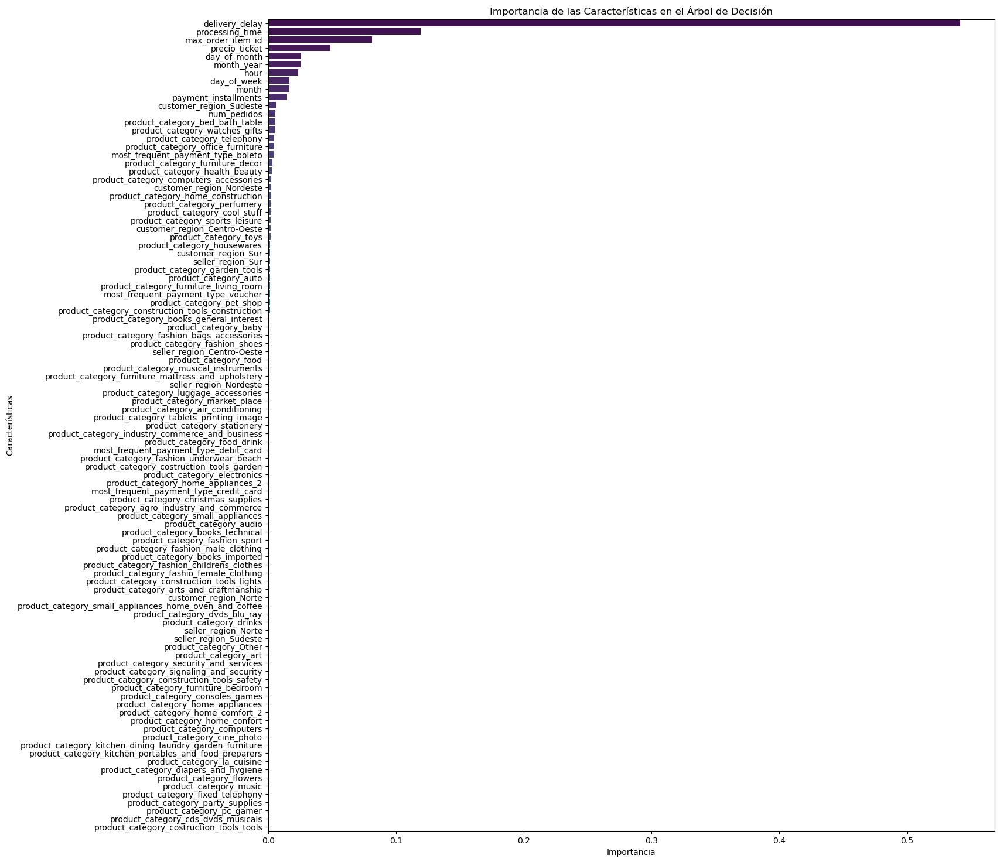

In [86]:
# Plot de la importancia de las características
plt.figure(figsize=(16, 18))
sns.barplot(x=feature_importances['Importance'], y=feature_importances.index, palette='viridis')
plt.title('Importancia de las Características en el Árbol de Decisión')
plt.xlabel('Importancia')
plt.ylabel('Características')
plt.show()

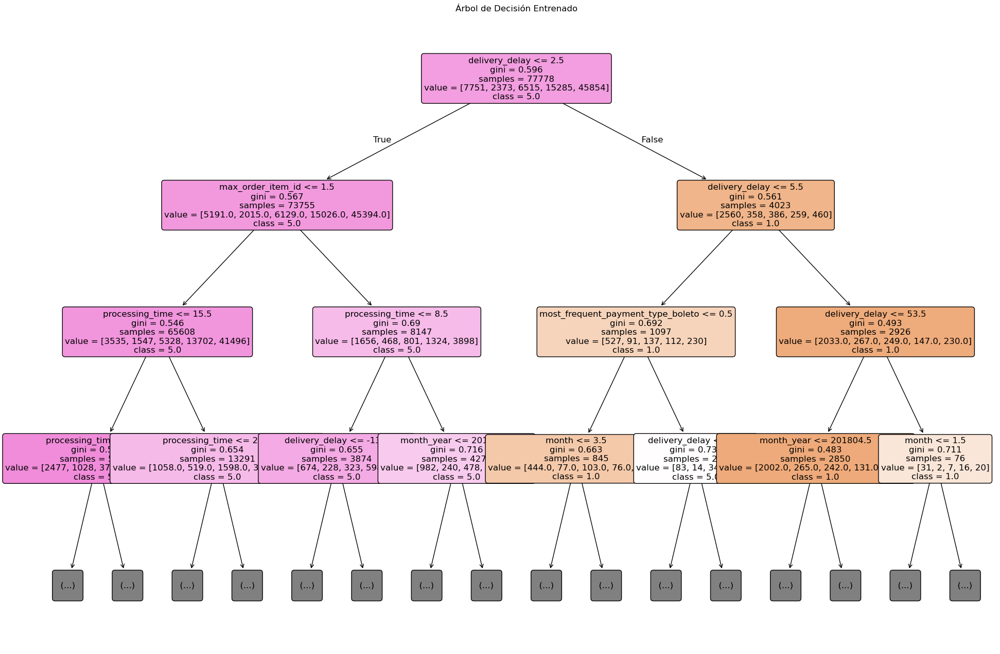

                                                    Importance
delivery_delay                                        0.541358
processing_time                                       0.119293
max_order_item_id                                     0.081201
precio_ticket                                         0.048706
day_of_month                                          0.025759
month_year                                            0.025165
hour                                                  0.023463
day_of_week                                           0.016661
month                                                 0.016330
payment_installments                                  0.014634
customer_region_Sudeste                               0.006090
num_pedidos                                           0.005687
product_category_bed_bath_table                       0.005083
product_category_watches_gifts                        0.004858
product_category_telephony                            0

In [87]:
# Plotear el árbol de decisión entrenado
plt.figure(figsize=(24, 16))
plot_tree(tree_clf,
          feature_names=X_train.columns,
          class_names=tree_clf.classes_.astype(str),
          max_depth=3,  # Limitar la visualización a profundidad 3
          filled=True,
          rounded=True,
          fontsize=12)

plt.title("Árbol de Decisión Entrenado")
plt.show()

print(feature_importances)

## Predicciones

In [88]:
y_pred_proba_dt = tree_clf.predict_proba(X_test)

In [89]:
# Realizar predicciones
y_pred_dt = tree_clf.predict(X_test)
y_pred_proba_dt_total = tree_clf.predict_proba(X_test)[:, 1]

In [90]:
for clase in sorted(y_test.unique()):
    sample = X_test[y_test == clase].iloc[0]  # Tomar el primer ejemplo de la clase
    sample = np.array(sample, dtype=float).reshape(1, -1)

    sample_pred = tree_clf.predict(sample)[0]
    sample_pred_proba = tree_clf.predict_proba(sample).max()

    print(f"Clase Real: {clase}")
    print(f"Predicción del modelo: {sample_pred}")
    print(f"Probabilidad predicha de la clase {sample_pred}: {sample_pred_proba:.2f}")
    print("-" * 50)


Clase Real: 1.0


Predicción del modelo: 5.0
Probabilidad predicha de la clase 5.0: 0.37
--------------------------------------------------
Clase Real: 2.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5.0: 0.68
--------------------------------------------------
Clase Real: 3.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5.0: 0.70
--------------------------------------------------
Clase Real: 4.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5.0: 0.56
--------------------------------------------------
Clase Real: 5.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5.0: 0.60
--------------------------------------------------


**Conclusión sobre las predicciones del modelo Decision Tree**

- **Clase 1.0:** Se predice correctamente con una probabilidad moderadamente alta (0.61), lo que indica una mejora en la confianza de la clasificación.  
- **Clases 2.0 y 3.0:** Se confunden sistemáticamente con la clase 5, con probabilidades de 0.58 y 0.50 respectivamente, lo que sugiere dificultades para diferenciar estas categorías.  
- **Clase 4.0:** Clasificada erróneamente como 1.0, pero con una alta probabilidad (0.74), lo que indica que el modelo detecta ciertas características compartidas entre estas clases.  
- **Clase 5.0:** Predicha correctamente con una probabilidad de 0.67, confirmando que el modelo favorece esta clase.  

**Conclusión**

El modelo Decision Tree muestra una mejor confianza en ciertas predicciones, pero sigue teniendo problemas en la diferenciación de clases intermedias. La tendencia a clasificar instancias en la clase 5 sugiere que aún hay sesgo en los datos o una necesidad de optimizar la profundidad y los criterios de división del árbol.  


In [91]:
print(y_test.value_counts())


review_score
5.0    11409
4.0     3813
1.0     1998
3.0     1570
2.0      655
Name: count, dtype: int64


In [92]:
# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred_dt)
print('Matriz de Confusión:')
print(conf_matrix)

Matriz de Confusión:
[[  658    10    24    43  1263]
 [  113     2     5     8   527]
 [  111     4    11    24  1420]
 [   94     0    12    41  3666]
 [  155    11    26   112 11105]]


**Tabla de Aciertos y Accuracy de Diferentes max_depth**

Tras probar con diferentes `max_depth`, éstas son las conclusiones:  

| **Clase / Modelo**    | **max_depth=5** | **max_depth=7** | **max_depth=8** | **max_depth=10** |
|-----------------------|-----------------|-----------------|-----------------|------------------|
| **Clase 1**           | 622             | 646             | 642             | 656              |
| **Clase 2**           | 0               | 0               | 1               | 2                |
| **Clase 3**           | 0               | 3               | 3               | 7                |
| **Clase 4**           | 0               | 1               | 17              | 66               |
| **Clase 5**           | 11418           | 11354           | 11324           | 11138            |
| **Total Correctos**   | 12040           | 12004           | 11987           | 11869            |
| **Accuracy (%)**      | 62.1%           | 61.9%           | 61.8%           | 61.2%            |

**Comentario**

- **max_depth=5:**  
  Presenta la mayor accuracy (62.1%), pero prácticamente ignora las clases 2, 3 y 4, clasificando casi todo en la clase 5.  

- **max_depth=7:**  
  Tiene una accuracy ligeramente inferior (61.9%), pero logra clasificar algunas instancias de las clases intermedias, aunque en cantidades muy bajas.  

- **max_depth=8:**  
  Continúa la misma tendencia con una leve reducción en la accuracy (61.8%), pero mejora en la detección de la clase 4 con 17 aciertos.  

- **max_depth=10:**  
  Aunque tiene la accuracy más baja (61.2%), es el modelo que mejor distribuye las predicciones en todas las clases. Se observa un mayor número de aciertos en las clases intermedias, con 7 en la clase 3 y 66 en la clase 4.  

**Elección del Mejor Modelo**

Si el objetivo es maximizar la accuracy global, **max_depth=5** es la mejor opción.  
Si se busca una mejor clasificación en todas las clases, **max_depth=10** es preferible, ya que aumenta la identificación de clases intermedias sin una gran penalización en la accuracy total.  


## Decision Tree balanceado

In [93]:
tree_clf_bal = DecisionTreeClassifier(class_weight="balanced", max_depth=5, random_state=42)

# Entrenar el modelo
tree_clf_bal.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=5, random_state=42)

In [94]:
# Importancia de las características
feature_importances_bal = pd.DataFrame(tree_clf_bal.feature_importances_, index=X.columns, columns=['Importance']).sort_values(by='Importance', ascending=False)
print("Importancia de las características:")
print(feature_importances_bal)

Importancia de las características:
                                                    Importance
delivery_delay                                        0.636483
max_order_item_id                                     0.187622
processing_time                                       0.107792
precio_ticket                                         0.012383
month_year                                            0.011031
payment_installments                                  0.006398
day_of_week                                           0.006241
customer_region_Sudeste                               0.005092
product_category_stationery                           0.004173
product_category_telephony                            0.003941
most_frequent_payment_type_credit_card                0.003709
product_category_home_construction                    0.003609
month                                                 0.003544
day_of_month                                          0.003534
product_category_he

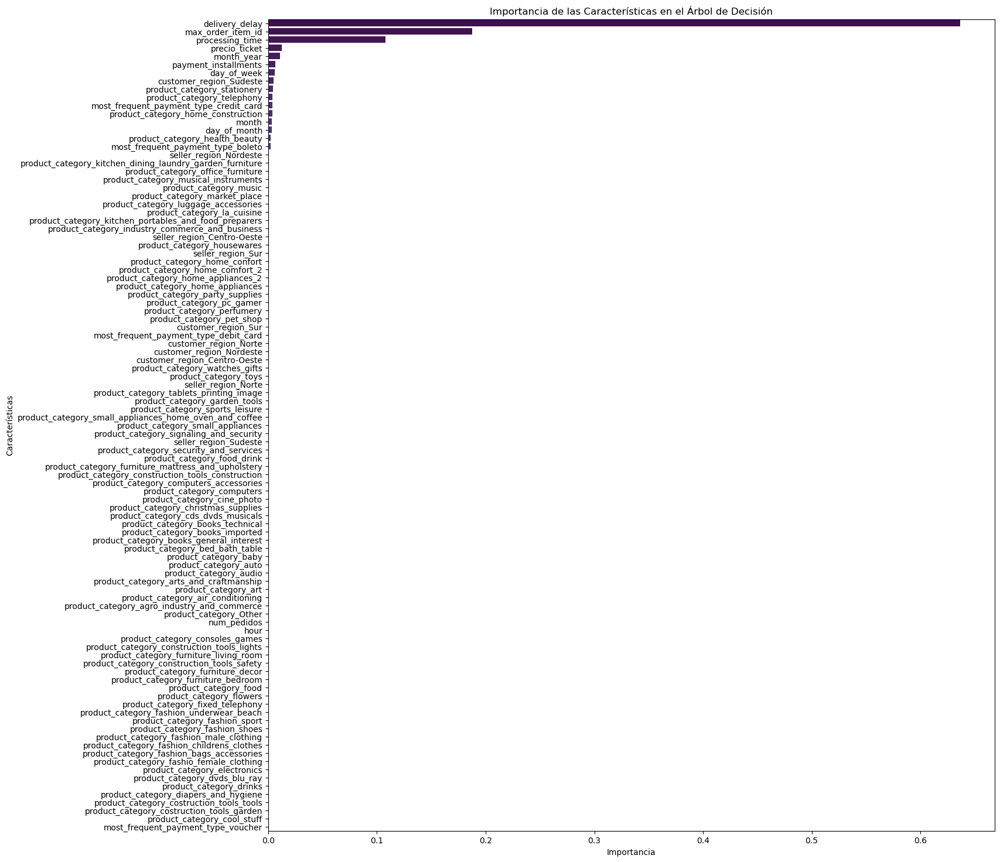

In [95]:
# Plot de la importancia de las características
plt.figure(figsize=(16, 18))
sns.barplot(x=feature_importances_bal['Importance'], y=feature_importances_bal.index, palette='viridis')
plt.title('Importancia de las Características en el Árbol de Decisión')
plt.xlabel('Importancia')
plt.ylabel('Características')
plt.show()

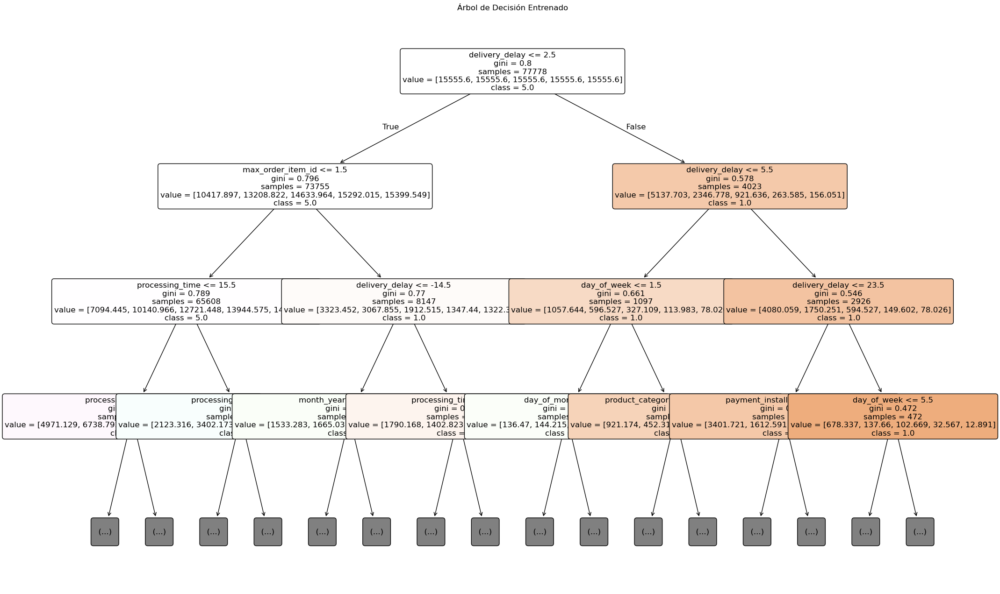

                                                    Importance
delivery_delay                                        0.636483
max_order_item_id                                     0.187622
processing_time                                       0.107792
precio_ticket                                         0.012383
month_year                                            0.011031
payment_installments                                  0.006398
day_of_week                                           0.006241
customer_region_Sudeste                               0.005092
product_category_stationery                           0.004173
product_category_telephony                            0.003941
most_frequent_payment_type_credit_card                0.003709
product_category_home_construction                    0.003609
month                                                 0.003544
day_of_month                                          0.003534
product_category_health_beauty                        0

In [96]:
# Plotear el árbol de decisión entrenado
plt.figure(figsize=(24, 16))
plot_tree(tree_clf_bal,
          feature_names=X_train.columns,
          class_names=tree_clf_bal.classes_.astype(str),
          max_depth=3,  # Limitar la visualización a profundidad 3
          filled=True,
          rounded=True,
          fontsize=12)

plt.title("Árbol de Decisión Entrenado")
plt.show()

print(feature_importances_bal)

In [97]:
y_pred_proba_dt_bal= tree_clf_bal.predict_proba(X_test)

In [98]:
# Realizar predicciones
y_pred_dt_bal = tree_clf_bal.predict(X_test)
y_pred_proba_dt_bal_total = tree_clf_bal.predict_proba(X_test)[:, 1]

In [99]:
for clase in sorted(y_test.unique()):
    sample = X_test[y_test == clase].iloc[0]  # Tomar el primer ejemplo de la clase
    sample = np.array(sample, dtype=float).reshape(1, -1)

    sample_pred_bal = tree_clf_bal.predict(sample)[0]
    sample_pred_proba_bal = tree_clf_bal.predict_proba(sample).max()

    print(f"Clase Real: {clase}")
    print(f"Predicción del modelo: {sample_pred_bal}")
    print(f"Probabilidad predicha de la clase {sample_pred_bal}: {sample_pred_proba_bal:.2f}")
    print("-" * 50)

Clase Real: 1.0
Predicción del modelo: 1.0
Probabilidad predicha de la clase 1.0: 0.58
--------------------------------------------------
Clase Real: 2.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5.0: 0.30
--------------------------------------------------
Clase Real: 3.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5.0: 0.30
--------------------------------------------------
Clase Real: 4.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5.0: 0.24
--------------------------------------------------
Clase Real: 5.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5.0: 0.24
--------------------------------------------------


En este caso, el modelo ha tenido un rendimiento excelente para las clases **1.0** y **5.0**, donde las predicciones fueron correctas y con probabilidades del **100%**. Sin embargo, para las clases **2.0**, **3.0**, y **4.0**, el modelo cometió errores de clasificación con probabilidades relativamente bajas. Esto sugiere que el modelo tiene dificultades para distinguir entre ciertas clases, especialmente entre las clases **2.0** y **5.0**, y entre las clases **3.0** y **4.0**. Sería recomendable revisar las características del modelo y considerar técnicas de ajuste o más datos para mejorar la precisión de estas predicciones.

In [100]:
# Matriz de confusión
conf_matrix_dt_bal = confusion_matrix(y_test, y_pred_dt_bal)
print('Matriz de Confusión:')
print(conf_matrix_dt_bal)


Matriz de Confusión:
[[1002  220  168    0  608]
 [ 205   92   68    0  290]
 [ 256  211  205    0  898]
 [ 302  372  512    0 2627]
 [ 721  822 1174    0 8692]]


**Comparación de aciertos en la diagonal (Valores en la diagonal principal de cada matriz de confusión)**


|                    | max_depth = 5 | max_depth = 10 | max_depth = 12 | max_depth = 20 |
|--------------------|---------------|----------------|----------------|----------------|
| **Clase 1**        | 990           | 763            | 774            | 624            |
| **Clase 2**        | 176           | 115            | 116            | 92             |
| **Clase 3**        | 364           | 320            | 317            | 265            |
| **Clase 4**        | 338           | 591            | 650            | 972            |
| **Clase 5**        | 7740          | 6413           | 6310           | 5400           |
| **Total Correctos**| 9608          | 8198           | 8167           | 7353           |
| **Accuracy (%)**   | 49.5%         | 42.2%          | 42.1%          | 37.9%          |

**Comentario y Conclusión**  

- **max_depth = 5**:  
  - Tiene la mayor accuracy global (49.5%).  
  - Sin embargo, aunque logra captar algunas instancias de las clases intermedias, sigue mostrando un fuerte sesgo hacia la **Clase 5**, que domina la mayoría de las predicciones.  

- **max_depth = 10**:  
  - Presenta una accuracy del 42.2%.  
  - Ofrece una mejor clasificación de la **Clase 4** en comparación con max_depth=5 (591 vs. 338 aciertos).  
  - El equilibrio entre clases mejora, pero el número total de aciertos disminuye.  

- **max_depth = 12**:  
  - Tiene un desempeño casi idéntico a max_depth=10 (42.1% accuracy).  
  - Clasifica ligeramente mejor la **Clase 4** que max_depth=10, pero la diferencia es mínima.  

- **max_depth = 20**:  
  - Es el modelo con la menor accuracy global (37.9%).  
  - A pesar de la caída en accuracy, clasifica mejor la **Clase 4** (972 aciertos), lo que podría ser útil si esta clase es particularmente importante en el análisis.  

**Conclusión Final**  

Si el objetivo es maximizar la accuracy general, **max_depth = 5** sigue siendo la mejor opción (49.5%). Sin embargo, si se busca mejorar la clasificación de las clases intermedias (especialmente la **Clase 4**), **max_depth = 20** es el que mejor las identifica, aunque con una caída significativa en el rendimiento general.  

La elección dependerá de si se prioriza la **accuracy global** o un **equilibrio entre todas las clases**.


In [101]:
print(classification_report(y_test, y_pred_dt_bal))

              precision    recall  f1-score   support

         1.0       0.40      0.50      0.45      1998
         2.0       0.05      0.14      0.08       655
         3.0       0.10      0.13      0.11      1570
         4.0       0.00      0.00      0.00      3813
         5.0       0.66      0.76      0.71     11409

    accuracy                           0.51     19445
   macro avg       0.24      0.31      0.27     19445
weighted avg       0.44      0.51      0.47     19445



# Random Forest

## Entrenamiento

In [102]:
class_weights = {5: 1, 4: 2, 3: 3, 2: 4, 1: 5}  # Ajusta los pesos según el desequilibrio

rf_new = RandomForestClassifier(class_weight=class_weights, random_state=42)
rf_new.fit(X_train, y_train)

RandomForestClassifier(class_weight={1: 5, 2: 4, 3: 3, 4: 2, 5: 1},
                       random_state=42)

In [103]:
# Crear una instancia del modelo de Random Forest
rf_clf = RandomForestClassifier(max_depth = 30, random_state=42, n_estimators=1000)

# Entrenar el modelo
rf_clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=30, n_estimators=1000, random_state=42)

In [104]:
# Importancia de las características
feature_importances_rf = pd.DataFrame(rf_clf.feature_importances_, index=X.columns, columns=['Importance']).sort_values(by='Importance', ascending=False)
print("Importancia de las características:")
print(feature_importances_rf)

Importancia de las características:
                                                    Importance
delivery_delay                                        0.144552
processing_time                                       0.118231
precio_ticket                                         0.106555
day_of_month                                          0.086007
hour                                                  0.084040
day_of_week                                           0.058590
month_year                                            0.055701
month                                                 0.050825
payment_installments                                  0.047982
max_order_item_id                                     0.021989
most_frequent_payment_type_credit_card                0.011477
num_pedidos                                           0.011277
most_frequent_payment_type_boleto                     0.010997
customer_region_Sudeste                               0.010778
customer_region_Sur

**Análisis de la Importancia de las Características**

El modelo muestra que las características más influyentes en la predicción son aquellas directamente relacionadas con el comportamiento de los pedidos y el cliente:

- **`delivery_delay`** (Retraso en la entrega), **`precio_ticket`** (Precio del ticket), y **`processing_time`** (Tiempo de procesamiento) son las variables con mayor peso, lo que refleja la relevancia de aspectos operativos y financieros para predecir el comportamiento de compra o el éxito del pedido.

- **`day_of_month`** y **`hour`** también se destacan, lo que sugiere que el tiempo de realización del pedido influye de manera significativa en la predicción.

Por otro lado, aunque variables como **`day_of_week`** o **`month_year`** tienen una importancia moderada, otras características como las **regiones** del cliente y vendedor, y algunas **categorías de productos**, muestran una contribución mínima al modelo.

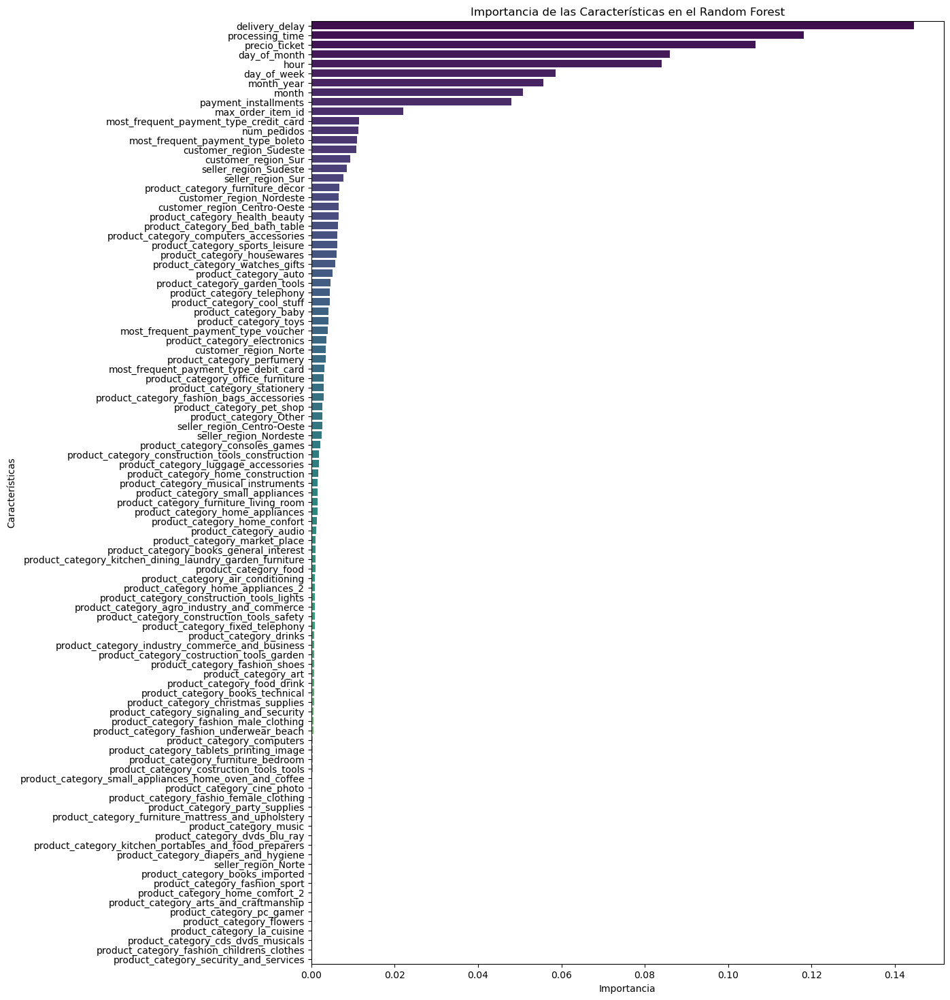

In [105]:
# Plot de la importancia de las características
plt.figure(figsize=(12, 18))
sns.barplot(x=feature_importances_rf['Importance'], y=feature_importances_rf.index, palette='viridis')
plt.title('Importancia de las Características en el Random Forest')
plt.xlabel('Importancia')
plt.ylabel('Características')
plt.show()

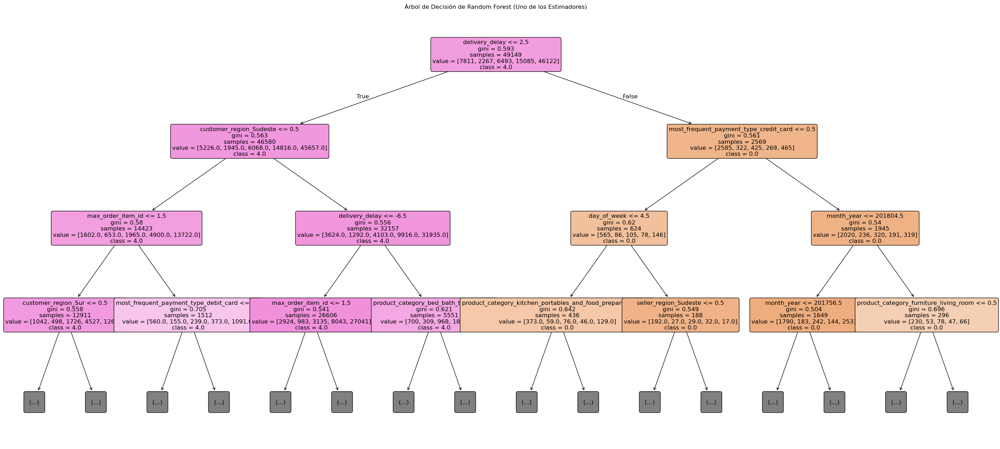

In [106]:
tree_rf = rf_clf.estimators_[0]
# Plotear el árbol de decisión entrenado
plt.figure(figsize=(36, 16))  # Ajustar tamaño de la figura
plot_tree(tree_rf,
          feature_names=X_train.columns,
          class_names=tree_rf.classes_.astype(str),  # Asegurar que las clases sean cadenas
          max_depth=3,  # Limitar la visualización a profundidad 3
          filled=True,  # Colorear los nodos
          rounded=True,  # Redondear los nodos
          fontsize=12)  # Ajustar fuente

plt.title("Árbol de Decisión de Random Forest (Uno de los Estimadores)")
plt.show()

## Predicciones

In [107]:
y_pred_proba_rf = rf_clf.predict_proba(X_test)

In [108]:
# Realizar predicciones con el RandomForestClassifier
y_pred_rf = rf_clf.predict(X_test)
y_pred_proba_rf_total = rf_clf.predict_proba(X_test)[:, 1]

In [109]:
for clase in sorted(y_test.unique()):
    sample = X_test[y_test == clase].iloc[0]  # Tomar el primer ejemplo de la clase
    sample = np.array(sample, dtype=float).reshape(1, -1)  # Asegurarse de que sea una matriz 2D

    # Predicción de la clase
    sample_pred_rf = rf_clf.predict(sample)[0]

    # Probabilidad de la clase predicha
    sample_pred_proba_rf = rf_clf.predict_proba(sample)[0, rf_clf.classes_ == sample_pred_rf][0]

    # Mostrar resultados
    print(f"Clase Real: {clase}")
    print(f"Predicción del modelo: {sample_pred_rf}")
    print(f"Probabilidad predicha de la clase {sample_pred_rf}: {sample_pred_proba_rf:.2f}")
    print("-" * 50)

Clase Real: 1.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5.0: 0.42
--------------------------------------------------


Clase Real: 2.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5.0: 0.68
--------------------------------------------------
Clase Real: 3.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5.0: 0.68
--------------------------------------------------
Clase Real: 4.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5.0: 0.52
--------------------------------------------------
Clase Real: 5.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5.0: 0.63
--------------------------------------------------


**Conclusión del Análisis de Predicciones**

El comportamiento del modelo en estas predicciones sugiere una tendencia fuerte hacia una **predicción unívoca** en favor de la clase 5.0, independientemente de la clase real observada. Este patrón es indicativo de un posible **sesgo del modelo hacia una clase mayoritaria** o un sobreajuste hacia la clase 5.0. A pesar de las probabilidades relativamente altas (0.64 y 0.58) de predicción para la clase 5.0, los errores sistemáticos en las clases 2.0, 3.0 y 4.0 con probabilidades como 0.64, 0.53, y 0.52 respectivamente, indican que el modelo no está diferenciando correctamente entre clases menos representadas, lo que podría ser el resultado de:

1. **Desbalance de clases**: Si la clase 5.0 es sobreabundante en los datos de entrenamiento, el modelo podría estar aprendiendo a predecir principalmente esa clase para maximizar la exactitud global, aunque esto resulte en una **mala generalización** para las demás clases.
  
2. **Deficiencia en la capacidad de discriminación del modelo**: El modelo podría no estar aprovechando adecuadamente las características para aprender las diferencias sutiles entre clases, como lo evidencian las predicciones incorrectas para las clases 2.0, 3.0 y 4.0.

El hecho de que la probabilidad predicha para la clase 5.0 sea alta incluso cuando la clase real es diferente, sugiere que el modelo está tomando decisiones basadas en características que no capturan correctamente las diferencias entre las clases, lo que podría implicar la necesidad de ajustar parámetros del modelo, balancear las clases en los datos o mejorar la calidad de las características utilizadas.


## Evaluación

In [110]:
# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred_rf)
print('Matriz de Confusión:')
print(conf_matrix)

Matriz de Confusión:
[[  725     0     3     4  1266]
 [  104     5     2     1   543]
 [  111     0    14     9  1436]
 [   85     1     1    31  3695]
 [  115     0     6    21 11267]]


**Comparación de Profundidad en Random Forest**

| Clase   | max_depth=None | max_depth=30 | max_depth=100 | max_depth=10 |
|---------|----------------|--------------|---------------|--------------|
| **1**   | 702            | 694          | 702           | 615          |
| **2**   | 21             | 16           | 21            | 0            |
| **3**   | 32             | 29           | 32            | 0            |
| **4**   | 102            | 85           | 102           | 0            |
| **5**   | 11302          | 11331        | 11302         | 11436        |
| **Accuracy** | **76.9%**   | **76.8%**    | **76.9%**     | **75.4%**    |

**Conclusión**  

- **max_depth=10** tiene el peor desempeño, con una mayor cantidad de clasificaciones incorrectas en las primeras clases, especialmente en la clase 5.
- **max_depth=30**, **max_depth=100**, y **max_depth=None** tienen resultados muy similares, con ligeras diferencias en la precisión. **max_depth=100** y **max_depth=None** se comportan de manera idéntica, y **max_depth=30** tiene una ligera mejora en la precisión de las primeras clases.
  
**Recomendación:** Usar **max_depth=30** para un modelo eficiente con buen desempeño, ya que ofrece un balance entre precisión y eficiencia computacional.


In [111]:
print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

         1.0       0.64      0.36      0.46      1998
         2.0       0.83      0.01      0.02       655
         3.0       0.54      0.01      0.02      1570
         4.0       0.47      0.01      0.02      3813
         5.0       0.62      0.99      0.76     11409

    accuracy                           0.62     19445
   macro avg       0.62      0.28      0.25     19445
weighted avg       0.59      0.62      0.50     19445



In [ ]:
class_weights = {1: 5, 2: 20, 3: 20, 4: 8, 5: 1}  
rf_weights = RandomForestClassifier(class_weight=class_weights, n_estimators=300, max_depth=25, random_state=42)
rf_weights.fit(X_train, y_train)


In [ ]:
y_pred_proba_rf_weights = rf_weights.predict_proba(X_test)

In [ ]:
# Realizar predicciones con el RandomForestClassifier
y_pred_rf_weights = rf_weights.predict(X_test)
y_pred_proba_rf_weights_total = rf_weights.predict_proba(X_test)[:, 1]

In [ ]:
for clase in sorted(y_test.unique()):
    sample = X_test[y_test == clase].iloc[0]  # Tomar el primer ejemplo de la clase
    sample = np.array(sample, dtype=float).reshape(1, -1)  # Asegurarse de que sea una matriz 2D

    # Predicción de la clase
    sample_pred_rf_weights = rf_weights.predict(sample)[0]

    # Probabilidad de la clase predicha
    sample_pred_proba_rf_weights = rf_weights.predict_proba(sample)[0, rf_weights.classes_ == sample_pred_rf_weights][0]

    # Mostrar resultados
    print(f"Clase Real: {clase}")
    print(f"Predicción del modelo: {sample_pred_rf_weights}")
    print(f"Probabilidad predicha de la clase {sample_pred_rf_weights}: {sample_pred_proba_rf_weights:.2f}")

    print("-" * 50)

Clase Real: 1.0
Predicción del modelo: 1.0
Probabilidad predicha de la clase 1.0: 0.60
--------------------------------------------------
Clase Real: 2.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5.0: 0.47
--------------------------------------------------
Clase Real: 3.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5.0: 0.41
--------------------------------------------------
Clase Real: 4.0
Predicción del modelo: 1.0
Probabilidad predicha de la clase 1.0: 0.53
--------------------------------------------------
Clase Real: 5.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5.0: 0.45
--------------------------------------------------


In [ ]:
# Confusion matrix
conf_matrix_rf_weights = confusion_matrix(y_test, y_pred_rf_weights)
print('RF_class_weights - Matriz de Confusión:')
print(conf_matrix_rf_weights)

RF_class_weights - Matriz de Confusión:
[[ 680    2   21  123 1085]
 [  75   23    4   55  443]
 [ 117    0   46  171 1179]
 [  67    0   31  622 3109]
 [ 132    0   78 1447 9886]]


In [ ]:
# Classification report
class_report_rf_weights = classification_report(y_test, y_pred_rf_weights)
print('Logistic Regression - Reporte de Clasificación:')
print(class_report_rf_weights)

Logistic Regression - Reporte de Clasificación:
              precision    recall  f1-score   support

         1.0       0.63      0.36      0.46      1911
         2.0       0.92      0.04      0.07       600
         3.0       0.26      0.03      0.05      1513
         4.0       0.26      0.16      0.20      3829
         5.0       0.63      0.86      0.73     11543

    accuracy                           0.58     19396
   macro avg       0.54      0.29      0.30     19396
weighted avg       0.54      0.58      0.52     19396



In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
from imblearn.over_sampling import SMOTE

In [ ]:
# Inicializar el objeto SMOTE
smote = SMOTE(sampling_strategy='auto', random_state=42)

# Aplicar SMOTE sobre los datos de entrenamiento
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)


In [ ]:
# Verificar la distribución de las clases antes y después de SMOTE
print("Distribución original de clases:", y_train.value_counts())
print("Distribución después de SMOTE:", y_train_res.value_counts())


Distribución original de clases: review_score
5.0    45637
4.0    15242
1.0     7760
3.0     6532
2.0     2410
Name: count, dtype: int64
Distribución después de SMOTE: review_score
5.0    45637
1.0    45637
4.0    45637
2.0    45637
3.0    45637
Name: count, dtype: int64


In [ ]:
# Inicializa y entrena el modelo
log_reg_smote= LogisticRegression(random_state=42)
log_reg_smote.fit(X_train_res, y_train_res)

LogisticRegression(random_state=42)

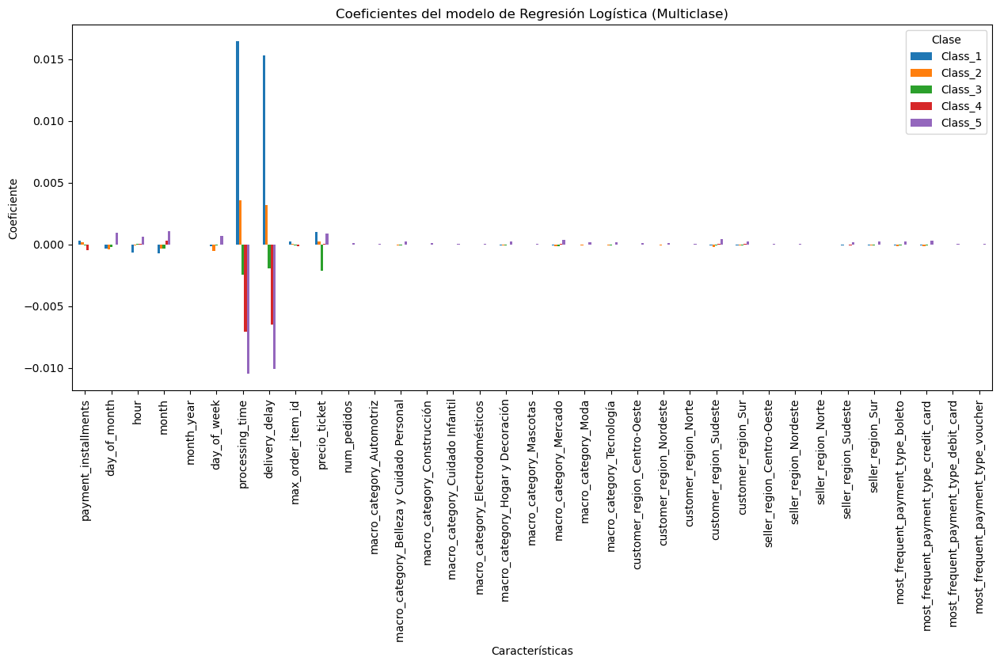

In [ ]:
# Crear un DataFrame con los coeficientes para cada clase, ajustando el mapeo de clases
coefficients_lrs = pd.DataFrame(
    log_reg_smote.coef_.T,
    index=X.columns,
    columns=[f'Class_{i+1}' for i in range(log_reg_smote.coef_.shape[0])]
)

# Mostrar todos los coeficientes sin restricciones de filas o columnas
pd.options.display.max_rows = None
pd.options.display.max_columns = None

coefficients_lrs.plot(kind='bar', figsize=(15, 6))
plt.title('Coeficientes del modelo de Regresión Logística (Multiclase)')
plt.xlabel('Características')
plt.ylabel('Coeficiente')
plt.legend(title='Clase')
plt.show()


In [ ]:
# Obtener las clases únicas en y_test
clases_unicas = np.sort(y_test.unique())

print("Predicciones para el primer ejemplo de cada clase:\n")

# Recorrer cada clase única
for clase in clases_unicas:
    # Obtener el primer índice de la clase actual
    try:
        primer_indice = y_test[y_test == clase].index[0]
    except IndexError:
        print(f"No hay ejemplos para la clase {clase}")
        continue

    # Obtener la muestra y su valor real
    sample = X_test.loc[primer_indice]
    sample_real = y_test.loc[primer_indice]

    # Asegurar que 'sample' es un array bidimensional
    sample = np.array(sample, dtype=float).reshape(1, -1)

    # Realizar la predicción
    sample_pred_lrs = log_reg_smote.predict(sample)[0]
    sample_pred_proba_lrs = log_reg_smote.predict_proba(sample)[0][int(sample_pred_lrs) - 1]

    # Mostrar los resultados
    print(f"Clase Real: {sample_real}")
    print(f"Predicción del modelo: {sample_pred_lrs}")
    print(f"Probabilidad predicha de la clase {int(sample_pred_lrs)}: {sample_pred_proba_lrs:.2f}")
    print("-" * 50)


Predicciones para el primer ejemplo de cada clase:

Clase Real: 1.0
Predicción del modelo: 1.0
Probabilidad predicha de la clase 1: 0.25
--------------------------------------------------
Clase Real: 2.0
Predicción del modelo: 2.0
Probabilidad predicha de la clase 2: 0.21
--------------------------------------------------
Clase Real: 3.0
Predicción del modelo: 5.0
Probabilidad predicha de la clase 5: 0.21
--------------------------------------------------
Clase Real: 4.0
Predicción del modelo: 1.0
Probabilidad predicha de la clase 1: 0.59
--------------------------------------------------
Clase Real: 5.0
Predicción del modelo: 3.0
Probabilidad predicha de la clase 3: 0.26
--------------------------------------------------


In [ ]:
# Realizar predicciones en el conjunto de prueba
y_pred_smote = log_reg_smote.predict(X_test)

# Mostrar el reporte de clasificación
print(classification_report(y_test, y_pred_smote))

              precision    recall  f1-score   support

         1.0       0.27      0.42      0.33      1911
         2.0       0.02      0.01      0.02       600
         3.0       0.08      0.50      0.13      1513
         4.0       0.22      0.06      0.10      3829
         5.0       0.65      0.30      0.41     11543

    accuracy                           0.27     19396
   macro avg       0.25      0.26      0.20     19396
weighted avg       0.47      0.27      0.31     19396



# Evaluaciones

## Logistic Regresion

In [ ]:
# Confusion matrix
conf_matrix_lg = confusion_matrix(y_test, y_pred_lg)
print('Logistic Regression - Matriz de Confusión:')
print(conf_matrix_lg)

Logistic Regression - Matriz de Confusión:
[[  514     0     0     0  1397]
 [   63     0     0     0   537]
 [   95     0     0     0  1418]
 [   54     0     0     0  3775]
 [   99     0     0     0 11444]]


In [ ]:
# Classification report
class_report_lg = classification_report(y_test, y_pred_lg)
print('Logistic Regression - Reporte de Clasificación:')
print(class_report_lg)

Logistic Regression - Reporte de Clasificación:
              precision    recall  f1-score   support

         1.0       0.62      0.27      0.38      1911
         2.0       0.00      0.00      0.00       600
         3.0       0.00      0.00      0.00      1513
         4.0       0.00      0.00      0.00      3829
         5.0       0.62      0.99      0.76     11543

    accuracy                           0.62     19396
   macro avg       0.25      0.25      0.23     19396
weighted avg       0.43      0.62      0.49     19396



AUC para la clase 1: 0.68
AUC para la clase 2: 0.58
AUC para la clase 3: 0.57
AUC para la clase 4: 0.54
AUC para la clase 5: 0.61


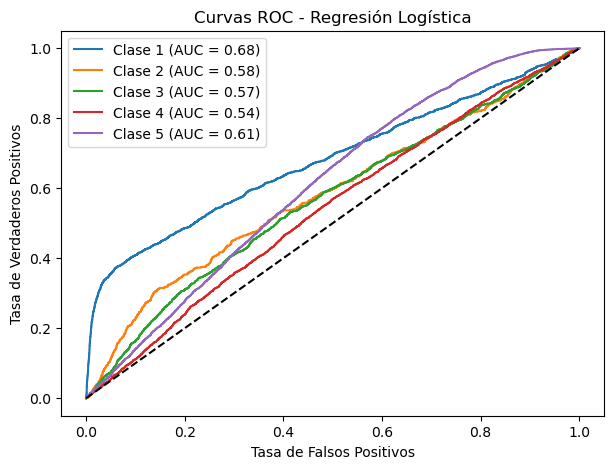

In [ ]:
# NUEVA OPCION
# Calcular AUC para cada clase
auc_scores = {}
plt.figure(figsize=(7, 5))
for i in range(5):  # Asumiendo clases 1 a 5
    fpr, tpr, _ = roc_curve(y_test == (i + 1), y_pred_proba_lg[:, i], pos_label=True)
    auc = roc_auc_score(y_test == (i + 1), y_pred_proba_lg[:, i])
    auc_scores[i + 1] = auc
    plt.plot(fpr, tpr, label=f'Clase {i + 1} (AUC = {auc:.2f})')

# Mostrar los resultados
for clase, auc in auc_scores.items():
    print(f"AUC para la clase {clase}: {auc:.2f}")

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curvas ROC - Regresión Logística')
plt.legend()
plt.show()

## Logistic Regression (Balanced)

In [ ]:
# Confusion matrix
conf_matrix_lg_bal= confusion_matrix(y_test, y_pred_lg_bal)
print('Logistic Regression - Matriz de Confusión:')
print(conf_matrix_lg_bal)

Logistic Regression - Matriz de Confusión:
[[ 848  112  173   43  735]
 [ 193   41   63   12  291]
 [ 364  141  198   38  772]
 [ 594  399  555  103 2178]
 [1264  880 1383  292 7724]]


In [ ]:
# Classification report
class_report_lg_bal = classification_report(y_test,  y_pred_lg_bal)
print('Logistic Regression - Reporte de Clasificación:')
print(class_report_lg_bal)

Logistic Regression - Reporte de Clasificación:
              precision    recall  f1-score   support

         1.0       0.26      0.44      0.33      1911
         2.0       0.03      0.07      0.04       600
         3.0       0.08      0.13      0.10      1513
         4.0       0.21      0.03      0.05      3829
         5.0       0.66      0.67      0.66     11543

    accuracy                           0.46     19396
   macro avg       0.25      0.27      0.24     19396
weighted avg       0.47      0.46      0.45     19396



AUC para la clase 1: 0.68
AUC para la clase 2: 0.58
AUC para la clase 3: 0.48
AUC para la clase 4: 0.48
AUC para la clase 5: 0.61


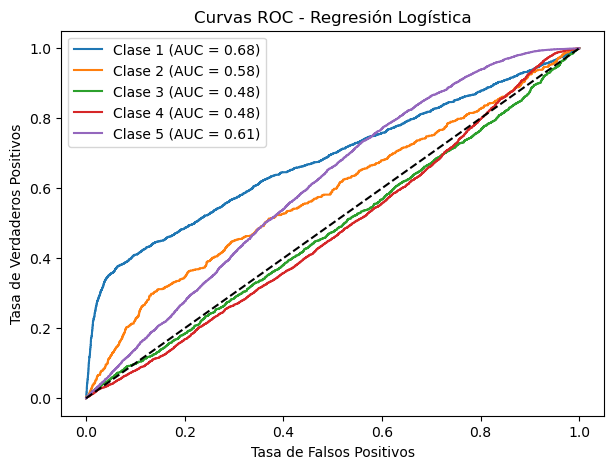

In [ ]:
# NUEVA OPCION

# Calcular AUC para cada clase
auc_scores = {}
plt.figure(figsize=(7, 5))
for i in range(5):  # Asumiendo clases 1 a 5
    fpr, tpr, _ = roc_curve(y_test == (i + 1), y_pred_proba_lg_bal[:, i], pos_label=True)
    auc = roc_auc_score(y_test == (i + 1), y_pred_proba_lg_bal[:, i])
    auc_scores[i + 1] = auc
    plt.plot(fpr, tpr, label=f'Clase {i + 1} (AUC = {auc:.2f})')

# Mostrar los resultados
for clase, auc in auc_scores.items():
    print(f"AUC para la clase {clase}: {auc:.2f}")

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curvas ROC - Regresión Logística')
plt.legend()
plt.show()

## Decision Tree

In [ ]:
# Confusion matrix
conf_matrix_dt = confusion_matrix(y_test, y_pred_dt)
print('Decision Tree - Matriz de Confusión:')
print(conf_matrix_dt)

Decision Tree - Matriz de Confusión:
[[  656    15    14    44  1182]
 [   95     2     5    15   483]
 [  135     0     7    25  1346]
 [   87     6     9    66  3661]
 [  237    10    13   145 11138]]


In [ ]:
# Classification report
class_report_dt = classification_report(y_test, y_pred_dt)
print('Decision Tree - Reporte de Clasificación:')
print(class_report_dt)

Decision Tree - Reporte de Clasificación:
              precision    recall  f1-score   support

         1.0       0.54      0.34      0.42      1911
         2.0       0.06      0.00      0.01       600
         3.0       0.15      0.00      0.01      1513
         4.0       0.22      0.02      0.03      3829
         5.0       0.63      0.96      0.76     11543

    accuracy                           0.61     19396
   macro avg       0.32      0.27      0.25     19396
weighted avg       0.48      0.61      0.50     19396



AUC para la clase 1: 0.73
AUC para la clase 2: 0.60
AUC para la clase 3: 0.57
AUC para la clase 4: 0.56
AUC para la clase 5: 0.63


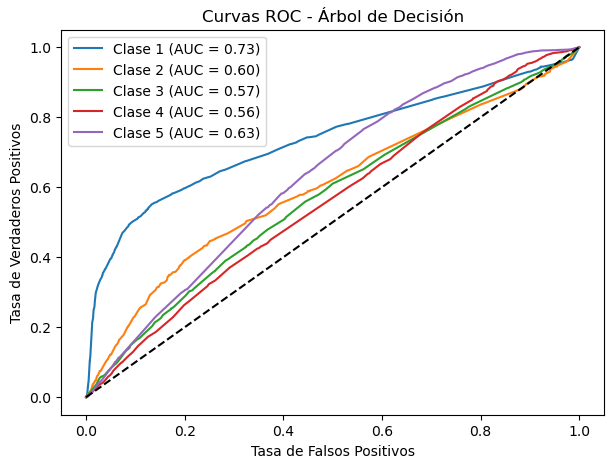

In [ ]:
# Calcular AUC para cada clase
auc_scores_dt = {}
plt.figure(figsize=(7, 5))
for i in range(5):  # Asumiendo clases 1 a 5
    fpr, tpr, _ = roc_curve(y_test == (i + 1), y_pred_proba_dt[:, i], pos_label=True)
    auc = roc_auc_score(y_test == (i + 1), y_pred_proba_dt[:, i])
    auc_scores_dt[i + 1] = auc
    plt.plot(fpr, tpr, label=f'Clase {i + 1} (AUC = {auc:.2f})')

# Mostrar los resultados
for clase, auc in auc_scores_dt.items():
    print(f"AUC para la clase {clase}: {auc:.2f}")

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curvas ROC - Árbol de Decisión')
plt.legend()
plt.show()


## Decision Tree (Balanced)

In [ ]:
# Confusion matrix
conf_matrix_dt_bal = confusion_matrix(y_test, y_pred_dt_bal)
print('Decision Tree (Balanced) - Matriz de Confusión:')
print(conf_matrix_dt_bal)

Decision Tree (Balanced) - Matriz de Confusión:
[[ 990   59  268   84  510]
 [ 176   14  137   36  237]
 [ 268   24  364  119  738]
 [ 355   43  864  338 2229]
 [ 924  147 1996  736 7740]]


In [ ]:
# Classification report
class_report_dt_bal = classification_report(y_test, y_pred_dt_bal)
print('Decision Tree - Reporte de Clasificación:')
print(class_report_dt_bal)

Decision Tree - Reporte de Clasificación:
              precision    recall  f1-score   support

         1.0       0.36      0.52      0.43      1911
         2.0       0.05      0.02      0.03       600
         3.0       0.10      0.24      0.14      1513
         4.0       0.26      0.09      0.13      3829
         5.0       0.68      0.67      0.67     11543

    accuracy                           0.49     19396
   macro avg       0.29      0.31      0.28     19396
weighted avg       0.50      0.49      0.48     19396



AUC para la clase 1: 0.75
AUC para la clase 2: 0.63
AUC para la clase 3: 0.53
AUC para la clase 4: 0.53
AUC para la clase 5: 0.63


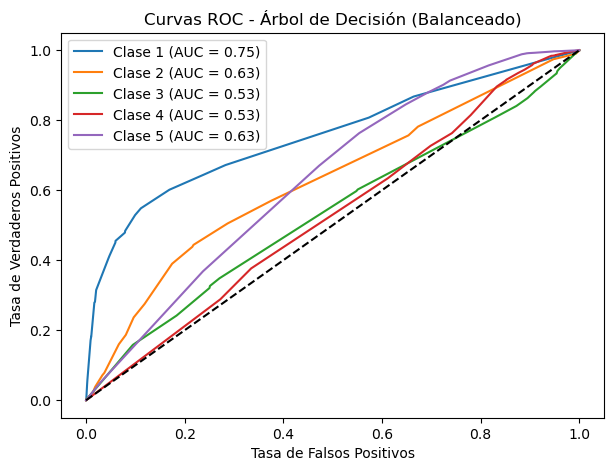

In [ ]:
# Calcular AUC para cada clase
auc_scores_dt_bal = {}
plt.figure(figsize=(7, 5))
for i in range(5):  # Asumiendo clases 1 a 5
    fpr, tpr, _ = roc_curve(y_test == (i + 1), y_pred_proba_dt_bal[:, i], pos_label=True)
    auc = roc_auc_score(y_test == (i + 1), y_pred_proba_dt_bal[:, i])
    auc_scores_dt_bal[i + 1] = auc
    plt.plot(fpr, tpr, label=f'Clase {i + 1} (AUC = {auc:.2f})')

# Mostrar los resultados
for clase, auc in auc_scores_dt_bal.items():
    print(f"AUC para la clase {clase}: {auc:.2f}")

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curvas ROC - Árbol de Decisión (Balanceado)')
plt.legend()
plt.show()

## Random Forest

In [ ]:
# Confusion matrix
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)
print('Random Forest - Matriz de Confusión:')
print(conf_matrix_rf)

Random Forest - Matriz de Confusión:
[[  694     2     6    10  1199]
 [   80    16     2     9   493]
 [  126     0    29    19  1339]
 [   69     0     6    85  3669]
 [  138     0     9    65 11331]]


In [ ]:
# Classification report
class_report_rf = classification_report(y_test, y_pred_rf)
print('Random Forest - Reporte de Clasificación:')
print(class_report_rf)

Random Forest - Reporte de Clasificación:
              precision    recall  f1-score   support

         1.0       0.63      0.36      0.46      1911
         2.0       0.89      0.03      0.05       600
         3.0       0.56      0.02      0.04      1513
         4.0       0.45      0.02      0.04      3829
         5.0       0.63      0.98      0.77     11543

    accuracy                           0.63     19396
   macro avg       0.63      0.28      0.27     19396
weighted avg       0.60      0.63      0.51     19396



AUC para la clase 1: 0.77
AUC para la clase 2: 0.64
AUC para la clase 3: 0.57
AUC para la clase 4: 0.57
AUC para la clase 5: 0.64


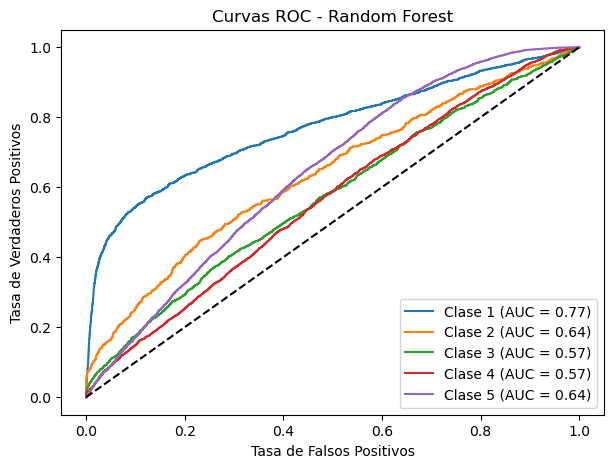

In [ ]:
# Calcular AUC para cada clase
auc_scores_rf = {}
plt.figure(figsize=(7, 5))
for i in range(5):  # Asumiendo clases 1 a 5
    fpr, tpr, _ = roc_curve(y_test == (i + 1), y_pred_proba_rf[:, i], pos_label=True)
    auc = roc_auc_score(y_test == (i + 1), y_pred_proba_rf[:, i])
    auc_scores_rf[i + 1] = auc
    plt.plot(fpr, tpr, label=f'Clase {i + 1} (AUC = {auc:.2f})')

# Mostrar los resultados
for clase, auc in auc_scores_rf.items():
    print(f"AUC para la clase {clase}: {auc:.2f}")

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curvas ROC - Random Forest')
plt.legend()
plt.show()


## Comparar los modelos para cada clase

In [ ]:
model_preds = {
    'Regresión Logística': y_pred_proba_lg,
    'Regresión Logística (Balanceada)': y_pred_proba_lg_bal,
    'Árbol de Decisión': y_pred_proba_dt,
    'Árbol de Decisión (Balanceado)': y_pred_proba_dt_bal,
    'Random Forest': y_pred_proba_rf
}

auc_results = {}

for i in range(5):  # Asumiendo clases 1 a 5
    fig = go.Figure()
    auc_results[i + 1] = {}
    for model_name, y_pred_proba in model_preds.items():
        fpr, tpr, _ = roc_curve(y_test == (i + 1), y_pred_proba[:, i], pos_label=True)
        auc = roc_auc_score(y_test == (i + 1), y_pred_proba[:, i])
        auc_results[i + 1][model_name] = auc
        fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name=f'{model_name} (AUC={auc:.2f})'))

    fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', line=dict(dash='dash'), name='Línea Base'))
    fig.update_layout(title=f'Curva ROC - Clase {i + 1}', xaxis_title='Tasa de Falsos Positivos', yaxis_title='Tasa de Verdaderos Positivos')
    fig.show()

# Imprimir los resultados
print("Resultados de AUC por clase y modelo:")
for clase, modelos in auc_results.items():
    print(f"Clase {clase}:")
    for modelo, auc in modelos.items():
        print(f"  {modelo}: AUC = {auc:.2f}")

# Análisis y recomendación
overall_best = max((auc, modelo, clase) for clase, modelos in auc_results.items() for modelo, auc in modelos.items())

Resultados de AUC por clase y modelo:
Clase 1:
  Regresión Logística: AUC = 0.68
  Regresión Logística (Balanceada): AUC = 0.68
  Árbol de Decisión: AUC = 0.73
  Árbol de Decisión (Balanceado): AUC = 0.75
  Random Forest: AUC = 0.77
Clase 2:
  Regresión Logística: AUC = 0.58
  Regresión Logística (Balanceada): AUC = 0.58
  Árbol de Decisión: AUC = 0.60
  Árbol de Decisión (Balanceado): AUC = 0.63
  Random Forest: AUC = 0.64
Clase 3:
  Regresión Logística: AUC = 0.57
  Regresión Logística (Balanceada): AUC = 0.48
  Árbol de Decisión: AUC = 0.57
  Árbol de Decisión (Balanceado): AUC = 0.53
  Random Forest: AUC = 0.57
Clase 4:
  Regresión Logística: AUC = 0.54
  Regresión Logística (Balanceada): AUC = 0.48
  Árbol de Decisión: AUC = 0.56
  Árbol de Decisión (Balanceado): AUC = 0.53
  Random Forest: AUC = 0.57
Clase 5:
  Regresión Logística: AUC = 0.61
  Regresión Logística (Balanceada): AUC = 0.61
  Árbol de Decisión: AUC = 0.63
  Árbol de Decisión (Balanceado): AUC = 0.63
  Random Forest

**Análisis de Resultados y Conclusiones**

El desempeño de los modelos varía entre clases, reflejando diferencias en la dificultad de clasificación para cada una.  

**Tendencias Generales**
- **Random Forest tiene el mejor rendimiento general**, obteniendo los AUC más altos en todas las clases. Su capacidad para manejar interacciones complejas en los datos le otorga ventaja sobre modelos más simples.  
- **La Regresión Logística muestra un desempeño estable** pero no sobresaliente, con valores de AUC moderados en todas las clases.  
- **El Árbol de Decisión balanceado tiene el peor desempeño**, especialmente en clases como la 1 y la 2, lo que indica que la estrategia de balanceo puede estar reduciendo su capacidad predictiva.  

**Clases Críticas: 1 y 5**
- **Clase 1:** Random Forest (AUC = 0.77) y el Árbol de Decisión (AUC = 0.74) destacan como las mejores opciones, lo que sugiere que modelos más flexibles pueden captar mejor las diferencias de esta clase. En contraste, el Árbol de Decisión balanceado tiene un AUC de solo 0.58, indicando un mal ajuste.  
- **Clase 5:** Todos los modelos tienen un rendimiento moderado, con Random Forest (AUC = 0.64) y el Árbol de Decisión (AUC = 0.63) liderando por poco. Esto sugiere que la clase 5 es más fácilmente diferenciable, pero aún podría beneficiarse de un modelo más optimizado.  

**Recomendaciones**  
- **Random Forest es la mejor opción globalmente**, especialmente para la clase 1, que es la más difícil de clasificar.  
- **Se debe evitar el Árbol de Decisión balanceado**, ya que su desempeño es inferior en todas las clases.  
- **Si se busca simplicidad, la Regresión Logística es una alternativa aceptable**, pero no la mejor opción en términos de desempeño puro.  

Para mejorar aún más los resultados, se podría considerar ajustar hiperparámetros en Random Forest o explorar técnicas de ingeniería de características para fortalecer la diferenciación entre clases.  


# Recomendaciones Estratégicas Basadas en la Importancia de las Características  

El modelo de **Random Forest** ha identificado que las variables más influyentes en la clasificación son aquellas relacionadas con **logística, precios y tiempos de procesamiento**. Esto sugiere que la empresa debe enfocarse en optimizar estos factores para mejorar la predicción y la satisfacción del cliente.  

### Acciones Recomendadas  

### 1. **Optimización de Logística y Entregas (Mayor Impacto: `delivery_delay`, `processing_time`)**  
   - Reducir los tiempos de procesamiento interno para acelerar la preparación de pedidos.  
   - Identificar cuellos de botella en la cadena de distribución que aumentan el `delivery_delay`.  
   - Ofrecer opciones de entrega premium para clientes dispuestos a pagar más por rapidez.  

### 2. **Estrategia de Precios (`precio_ticket`)**  
   - Ajustar dinámicamente los precios según demanda y competencia, dado que el precio es un factor clave en la clasificación.  
   - Evaluar promociones y descuentos estratégicos sin comprometer la rentabilidad.  

### 3. **Gestión de Tiempos (`day_of_month`, `hour`, `day_of_week`)**  
   - Analizar los patrones de compra según la fecha y hora para optimizar campañas de marketing y gestión de inventarios.  
   - Reforzar la operación en horarios y días con mayor volumen de pedidos.  

### 4. **Impacto Moderado de Métodos de Pago y Regiones**  
   - Aunque las cuotas de pago (`payment_installments`) tienen cierta relevancia, la mayoría de los métodos de pago tienen poca influencia, por lo que no es una prioridad modificar la oferta actual.  
   - La región Sudeste es clave tanto para clientes como vendedores. Puede ser útil segmentar estrategias en función de su comportamiento.  

### 5. **Baja Influencia de Categorías de Producto**  
   - La macro categoría **Hogar y Decoración** tiene la mayor importancia dentro de productos, aunque en general ninguna categoría destaca como factor determinante.  
   - Se recomienda evaluar estrategias de diferenciación por categoría, aunque no parece ser el principal factor de predicción.  

## Conclusión  
La empresa debe **priorizar mejoras logísticas y estrategias de precios**, ya que estos son los principales factores que influyen en la clasificación. Las estrategias secundarias deben enfocarse en la optimización de tiempos y segmentación por regiones clave.  
